In [1]:
import scanpy as sc

In [1]:
import scanpy as sc 
import pandas as pd
plates_five=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/5SGns_umicount_intronexon.h5ad")
plates_five

SystemError: initialization of _internal failed without raising an exception

In [6]:
introexon=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/Smartseq3xpress_umicount_intronexon.h5ad")
introexon

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4224 × 53040
    obs: 'sample_ID_Plate'

In [7]:
# Get common genes
common_genes = introexon.var_names.intersection(plates_five.var_names)

# Print the number of common genes
print("Number of common genes: ", len(common_genes))



Number of common genes:  43034


In [8]:
# Making gene names unique
introexon.var_names_make_unique()
plates_five.var_names_make_unique()

# Subset the AnnData objects to include only the common genes
introexon_common = introexon[:, common_genes].copy()
plates_five_common = plates_five[:, common_genes].copy()


In [9]:
plates_five_common.obs["batch"] = "batch1"
introexon_common.obs["batch"] = "batch2"


In [24]:
introexon_common.obs

,sample_ID_Plate,batch
AACCACATCGAACGCCTCGA,11101383,batch2
AACCACATCGACAACTCGAA,11101383,batch2
AACCACATCGAGGTGTCGAG,11101383,batch2
AACCACATCGATCCAAGGAA,11101383,batch2
AACCACATCGCACGGTGGTT,11101383,batch2
...,...,...
TTGATCTTGGTAGCGTTGGA,11101390,batch2
TTGATCTTGGTCACTTCCAT,11101390,batch2
TTGATCTTGGTCCAATGTGG,11101390,batch2
TTGATCTTGGTGACTCAAGG,11101390,batch2


In [10]:
# Merge the two AnnData objects
merged_data = sc.concat([introexon_common, plates_five_common], 
                        join='inner',  # Ensures intersection of features
                        index_unique=None)  # No unique index generation

merged_data

AnnData object with n_obs × n_vars = 6144 × 43034
    obs: 'sample_ID_Plate', 'batch'

In [11]:
merged_data.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/merged_intersection.h5ad")

In [2]:
merged_data=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/merged_intersection.h5ad")
merged_data

AnnData object with n_obs × n_vars = 6144 × 43034
    obs: 'sample_ID_Plate', 'batch'

In [3]:
merged_data.layers["umi"]=merged_data.X.copy()

In [4]:
merged_data

AnnData object with n_obs × n_vars = 6144 × 43034
    obs: 'sample_ID_Plate', 'batch'
    layers: 'umi'

In [5]:
merged_data.var_names

Index(['Gnai3', 'Pbsn', 'Cdc45', 'H19', 'Scml2', 'Apoh', 'Narf', 'Cav2',
       'Klf6', 'Scmh1',
       ...
       'rRNA_rnacentral_252', 'rRNA_rnacentral_253', 'rRNA_rnacentral_330',
       'rRNA_rnacentral_332', 'rRNA_rnacentral_340', 'rRNA_rnacentral_341',
       'rRNA_rnacentral_342', 'rRNA_rnacentral_361', 'rRNA_rnacentral_367',
       'rRNA_rnacentral_86'],
      dtype='object', length=43034)

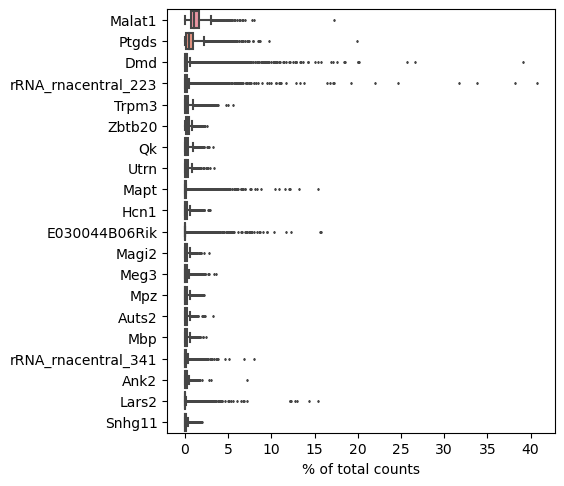

In [6]:
sc.pl.highest_expr_genes(merged_data, n_top=20, )


In [7]:
sc.pp.highly_variable_genes(merged_data, n_top_genes=2000, flavor='seurat_v3',layer='umi')


In [8]:
sc.pp.filter_cells(merged_data, min_genes=200)
sc.pp.filter_genes(merged_data, min_cells=3)

/proj/sensoryaging/scvi-env/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


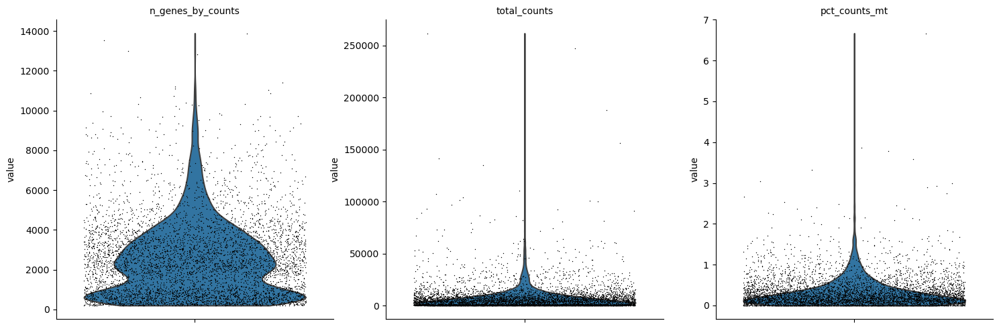

In [9]:
merged_data.var['mt'] = merged_data.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(merged_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(merged_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

/proj/sensoryaging/scvi-env/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


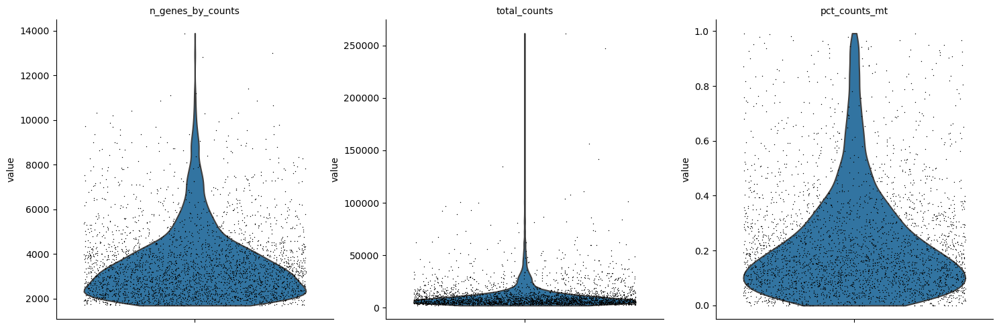

In [10]:
introexon1=merged_data[merged_data.obs.n_genes_by_counts > 1700, :]
introexon1=introexon1[introexon1.obs.pct_counts_mt < 1.0,]
sc.pl.violin(introexon1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [13]:
import scvi

scvi.model.SCVI.setup_anndata(introexon2)
vae=scvi.model.SCVI(introexon2)
vae.train()
solo=scvi.external.SOLO.from_scvi_model(vae)
solo.train()
solo.predict()
df=solo.predict()
df['prediction']=solo.predict(soft=False)
df
df[df.prediction == 'doublet']
introexon2.obs['prediction']=df.prediction
introexon2.obs


/proj/sensoryaging/scvi-env/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /proj/sensoryaging/scvi-env/lib/python3.11/site-pack ...
  rank_zero_warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/proj/sensoryaging/scvi-env/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /proj/sensoryaging/scvi-env/lib/python3.11/site-pack ...
  rank_zero_warn(


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

/proj/sensoryaging/scvi-env/lib/python3.11/site-packages/lightning/pytorch/trainer/call.py:53: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [12]:
introexon2=introexon1.copy()

In [20]:
sc.pp.normalize_total(introexon2, target_sum=None)


In [21]:
sc.pp.log1p(introexon2)


In [22]:
sc.pp.combat(introexon2,key='batch')

Found 18 genes with zero variance.


/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


In [23]:
sc.pp.highly_variable_genes(introexon2, n_top_genes=1000, flavor='seurat_v3',layer='umi')


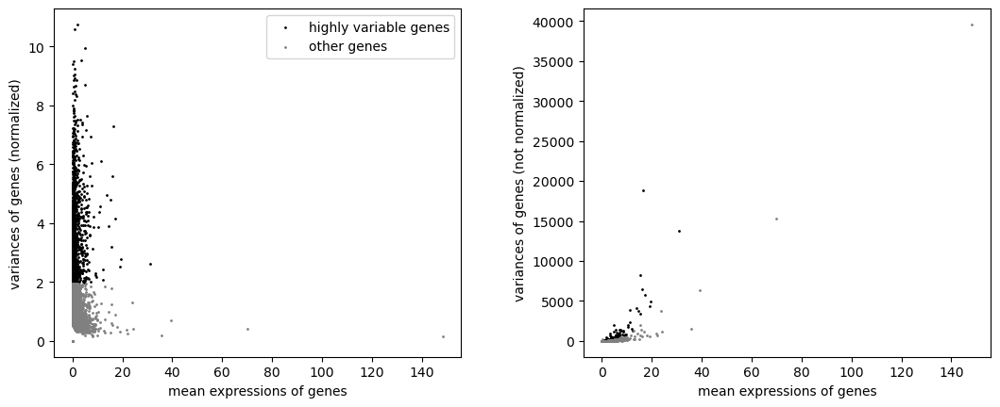

In [24]:
sc.pl.highly_variable_genes(introexon2)

In [25]:
introexon3=introexon2.copy()

In [26]:
sc.pp.scale(introexon2, max_value=10)


In [27]:
sc.tl.pca(introexon2, svd_solver='arpack')


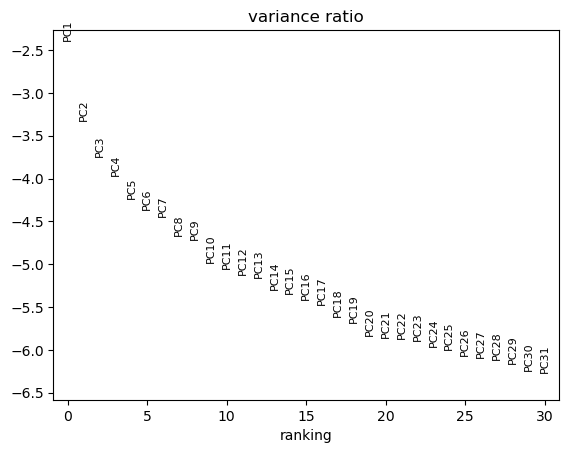

In [28]:
sc.pl.pca_variance_ratio(introexon2, log=True)


In [29]:
sc.pp.neighbors(introexon2, n_neighbors=50, n_pcs=15)


/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:

In [30]:
sc.tl.leiden(introexon2, resolution=0.3)
sc.tl.umap(introexon2,min_dist=0.2)

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


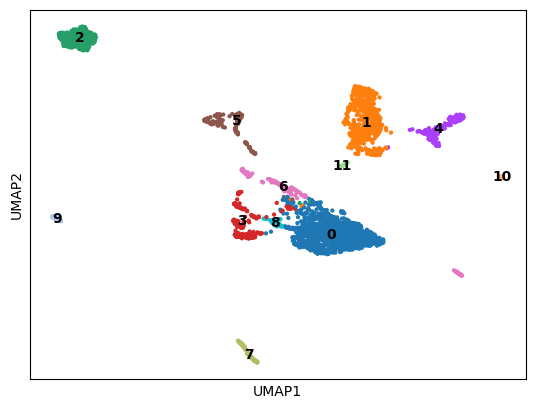

In [31]:
# show the louvain clusters in the UMAP
sc.pl.umap(introexon2, color=['leiden'], legend_loc='on data', title='')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


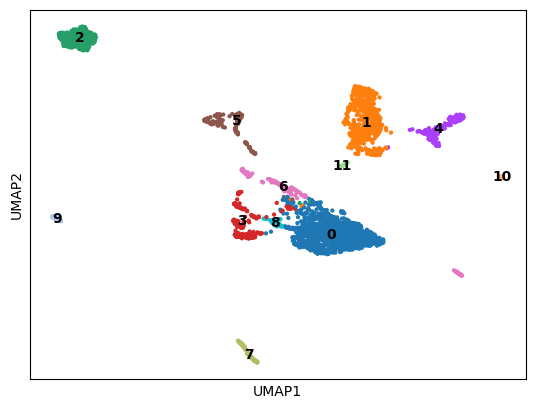

In [32]:
# show the louvain clusters in the UMAP
sc.pl.umap(introexon2, color=['leiden'], legend_loc='on data', title='')

In [49]:
introexon2.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/modified_intersection_16_plates.h5ad")

#read the file

### read the file 

In [1]:
import scanpy as sc
import pandas as pd

In [3]:
introexon2=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/modified_intersection_16_plates.h5ad")

In [4]:
introexon2

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


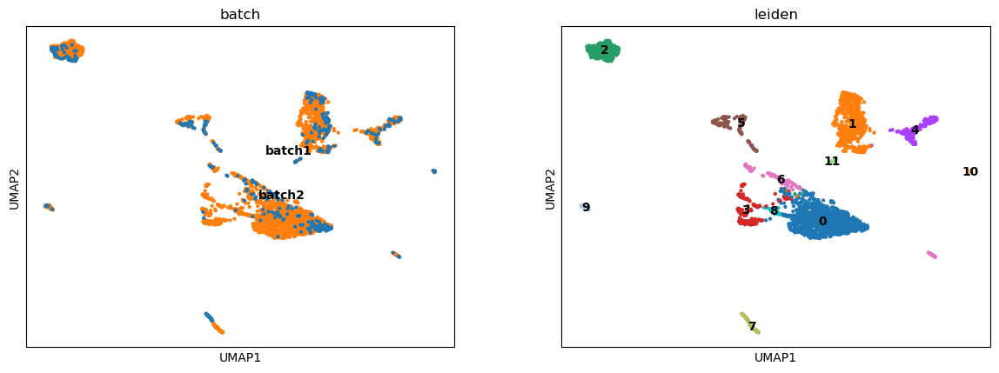

In [5]:
sc.pl.umap(introexon2,color=['batch','leiden'], legend_loc='on data')

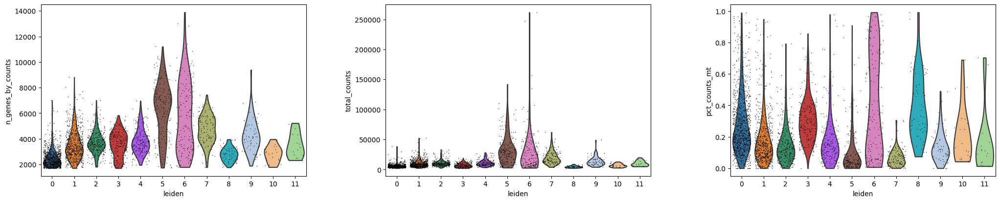

In [6]:
sc.pl.violin(introexon2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],groupby='leiden',
             jitter=0.4, multi_panel=True)

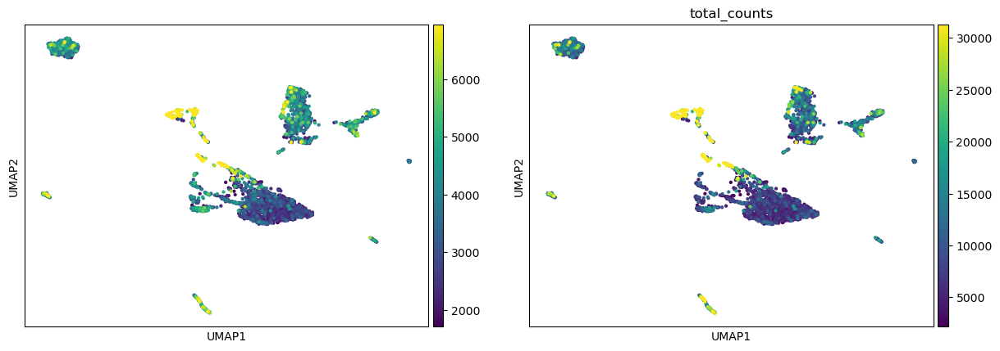

In [7]:
#show n_genes_by_counts
sc.pl.umap(introexon2, color=['n_genes_by_counts','total_counts'], legend_loc='on data', title='',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldc

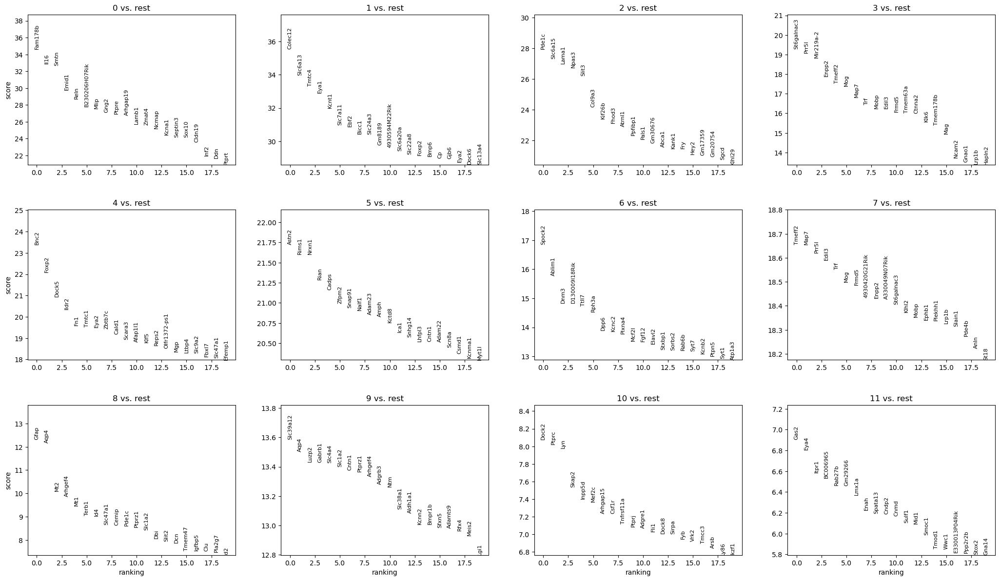

In [8]:
sc.pp.log1p(introexon2)
sc.tl.rank_genes_groups(introexon2, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(introexon2, n_genes=20, sharey=False)

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


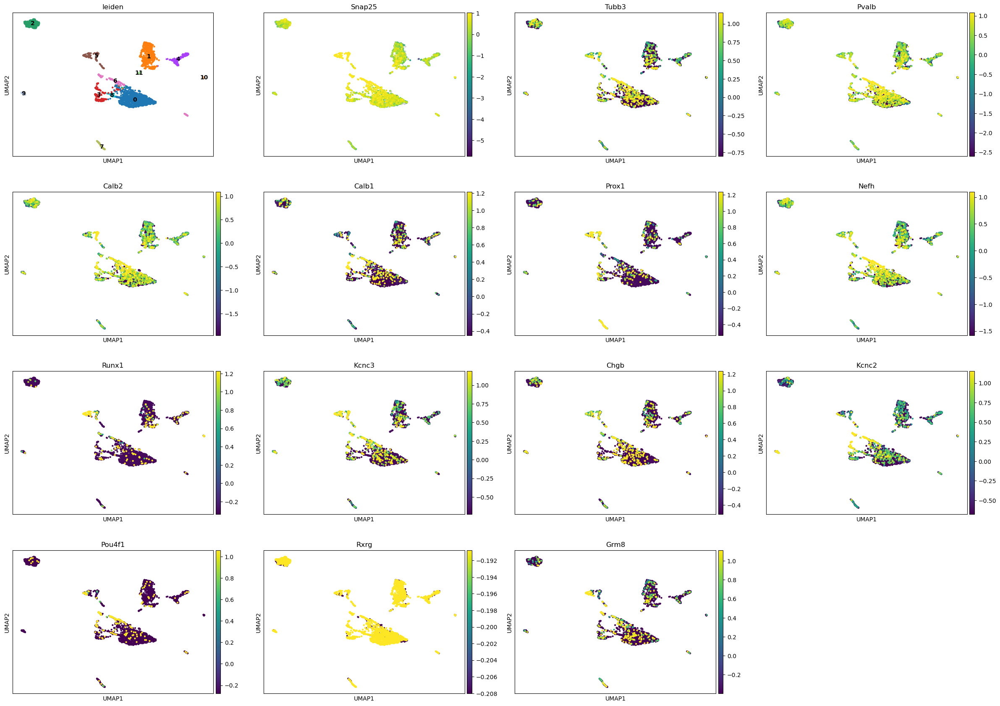

In [9]:
sc.pl.umap(introexon2, color=['leiden','Snap25','Tubb3','Pvalb','Calb2','Calb1','Prox1','Nefh','Runx1','Kcnc3','Chgb','Kcnc2','Pou4f1','Rxrg','Grm8'], legend_loc='on data',vmax='p95')

In [10]:
introexon2.obs['sex'] = ['male' if val > 0 else 'female' for val in introexon2[:, 'Uty'].X]


In [11]:
introexon2.obs['sex'].value_counts()

sex
male      1659
female    1499
Name: count, dtype: int64

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


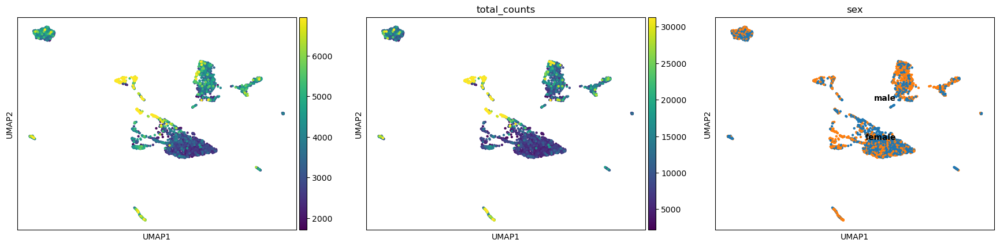

In [12]:
sc.pl.umap(introexon2, color=['n_genes_by_counts','total_counts','sex'], legend_loc='on data', title='',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


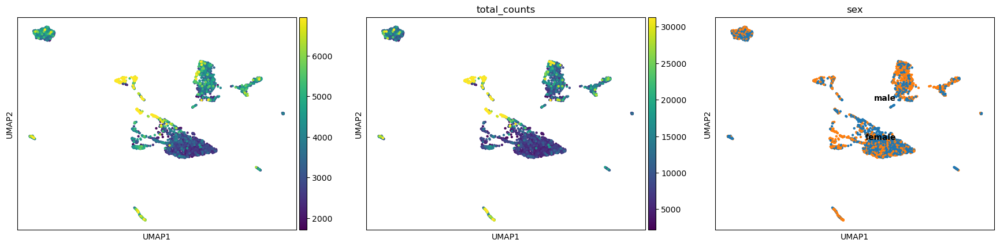

In [13]:
sc.pl.umap(introexon2, color=['n_genes_by_counts','total_counts','sex'], legend_loc='on data', title='',vmax='p95')

In [72]:
cell_markers={
    'Sgns':['Nefh','Snap25'],
    'Glial_cell':['Mog','Tubb4a'],
    'Schwann_cell':['Mpz','Pmp22'],
    'Chondrocyte':['Prg4','Slc26a2'],
    'osteoblast':['Dio2','Runx2'],
    'Marginal_cell':['Kcnq1','Kcne1'],
    'Type1A':['Chchd10'],
    'Type1B':['Calb1'],
    'type IC':['Pou4f1'],
    'Type II':['Th']
}

def umap(a):
    sc.pl.umap(modified,color=a,vmax='p95')

In [ ]:
#Nefh average expression in raw data


UMAP for Sgns:


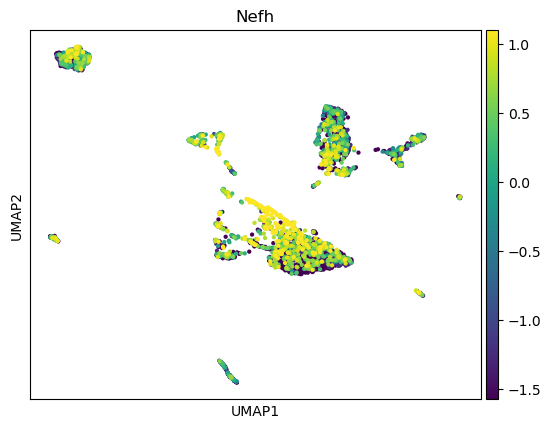

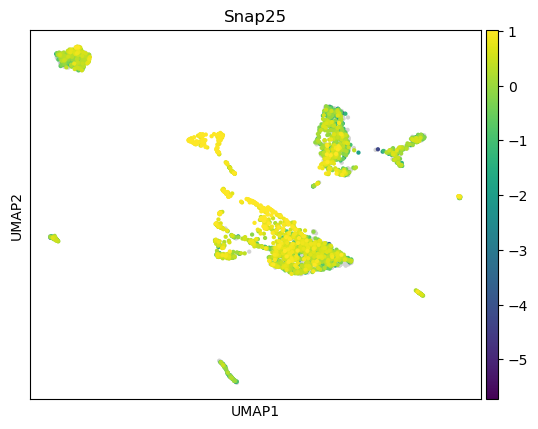

UMAP for Glial_cell:


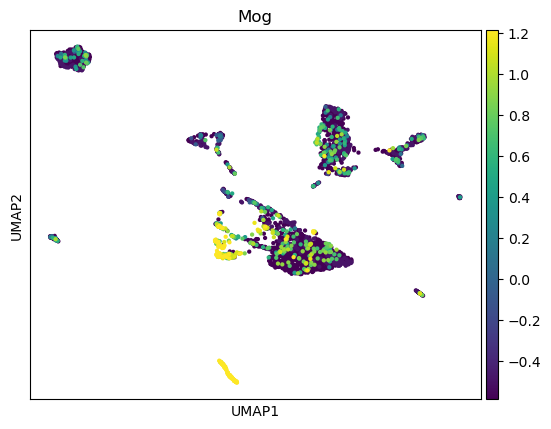

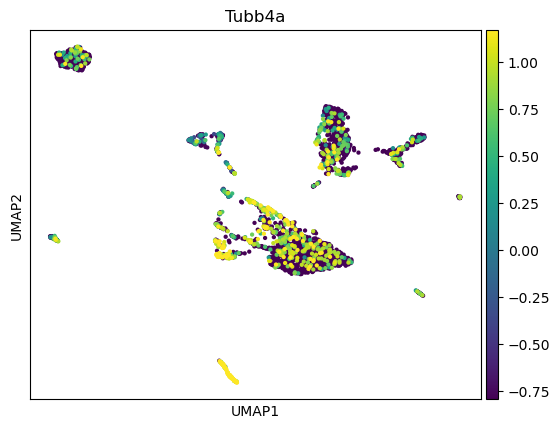

UMAP for Schwann_cell:


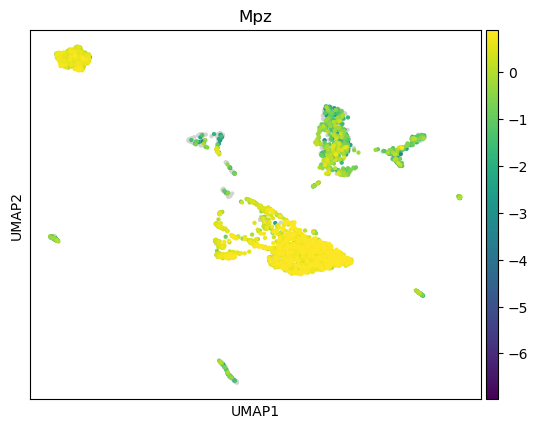

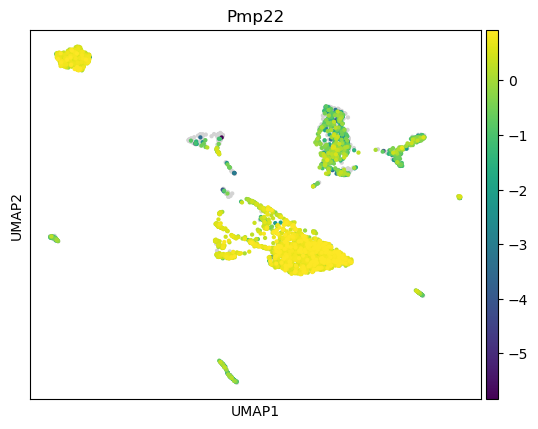

UMAP for Chondrocyte:


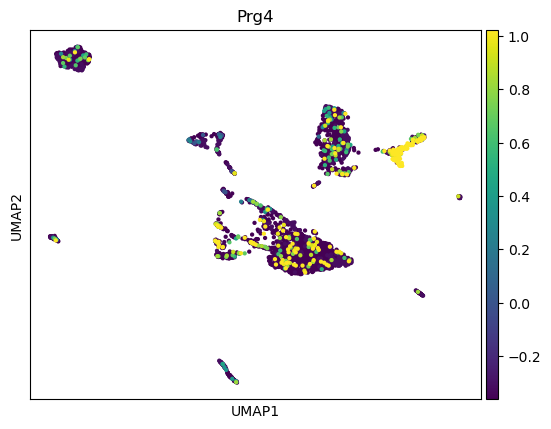

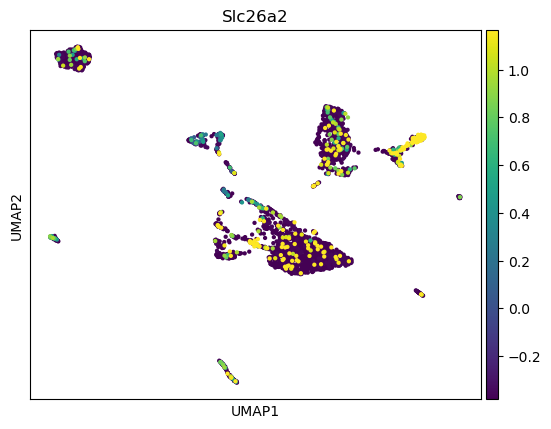

UMAP for osteoblast:


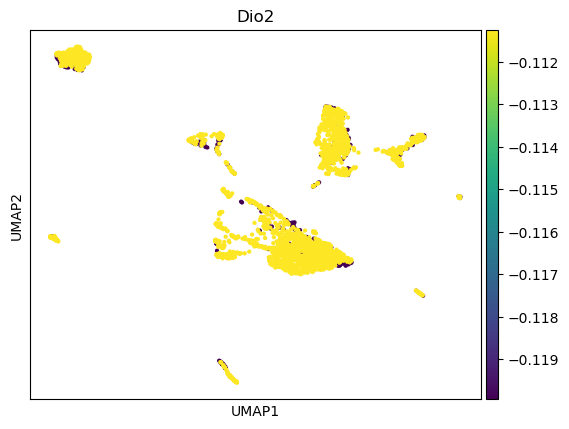

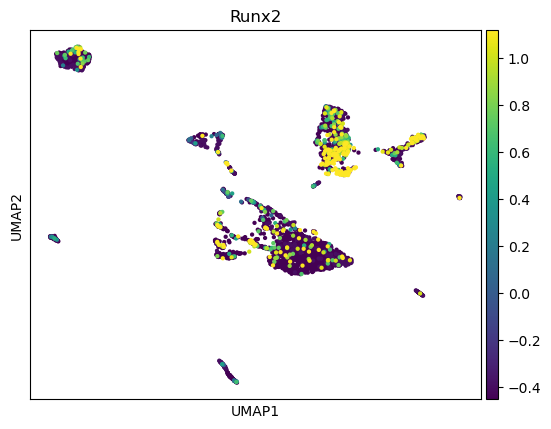

UMAP for Marginal_cell:


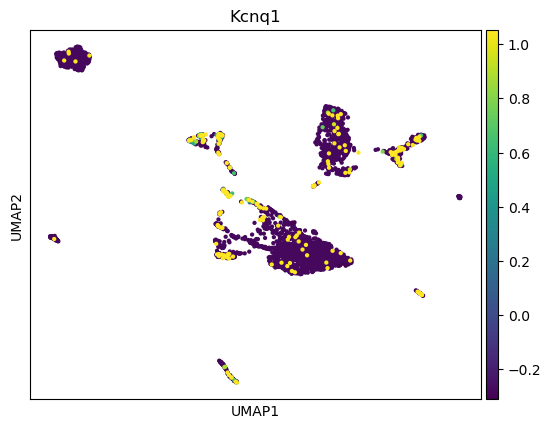

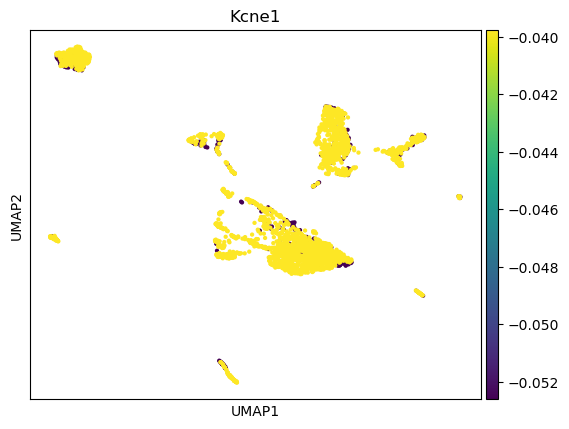

UMAP for Type1A:


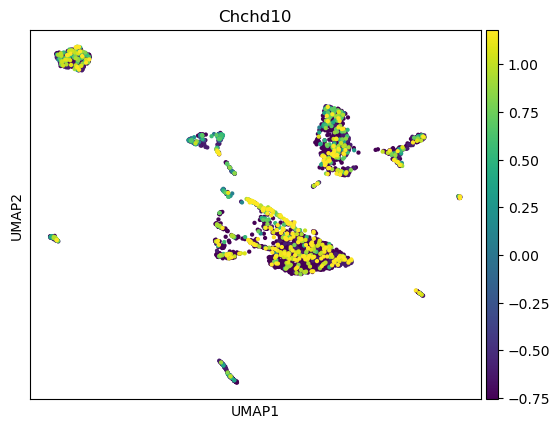

UMAP for Type1B:


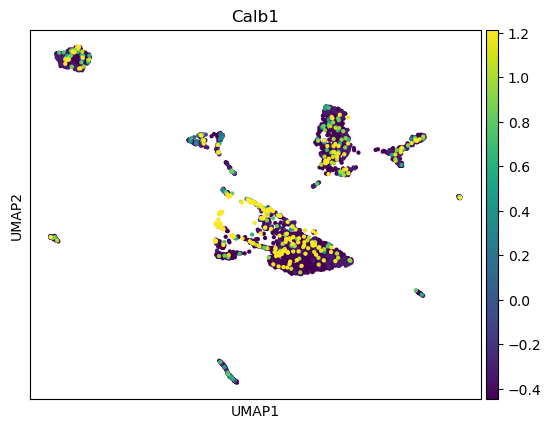

UMAP for type IC:


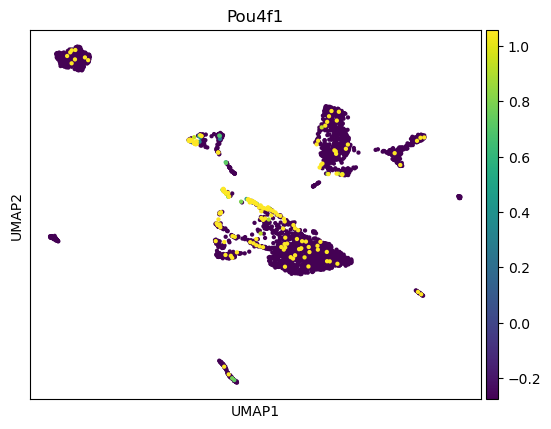

UMAP for Type II:


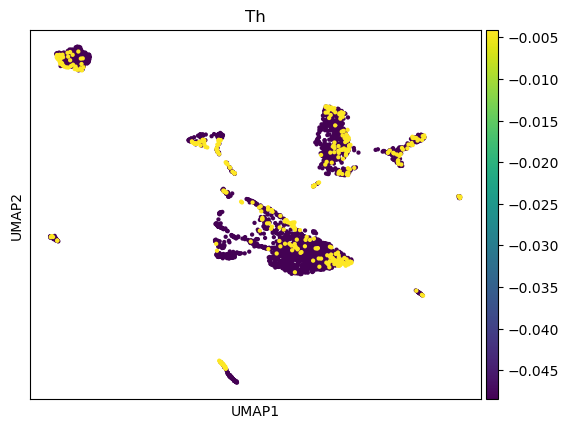

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


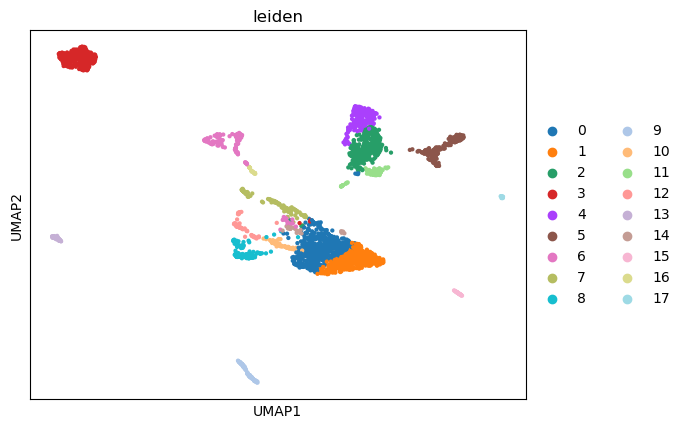

Genes not found: []


In [73]:
not_found_genes = []
from matplotlib.backends.backend_pdf import PdfPages


for cell_type, markers in cell_markers.items():
    print(f"UMAP for {cell_type}:")
    for marker in markers:

        try:
            umap(marker)


        except KeyError:
            print(f"Gene {marker} not found.")
            not_found_genes.append(marker)
sc.pl.umap(modified, color='leiden',vmax='p95',vmin='p1.5')
# Print the genes that are not found
print(f"Genes not found: {not_found_genes}")

In [1]:
### try with other doublet removel package

In [4]:
import scrublet as scr

In [35]:
import scanpy as sc
introexon2=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/introexon2.h5ad")
introexon2

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'umi'

In [6]:
sc.pp.highly_variable_genes(introexon2, n_top_genes=1500, flavor='seurat_v3',layer='umi')


In [7]:
introexon2

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'
    layers: 'umi'

In [10]:
modified=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/modified_intersection_16_plates.h5ad")
modified

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [26]:
modified.layers['umi']

array([[ 0.,  0.,  0., ..., 15.,  0.,  0.],
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  6.,  1.,  0.],
       ...,
       [ 1.,  0.,  0., ..., 15.,  0.,  0.],
       [ 3.,  0.,  0., ..., 19.,  4.,  0.],
       [ 0.,  0.,  0., ..., 13.,  0.,  0.]], dtype=float32)

In [27]:
import scrublet as scr
scrub = scr.Scrublet(modified.layers['umi'], expected_doublet_rate=0.06)

In [28]:
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.36
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 27.3%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 3.1%
Elapsed time: 29.6 seconds


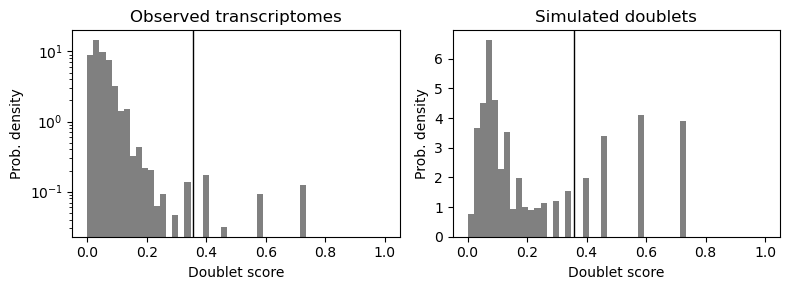

In [29]:
scrub.plot_histogram();

In [30]:
print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))

# # Uncomment to run tSNE - slow
# print('Running tSNE...')
# scrub.set_embedding('tSNE', scr.get_tsne(scrub.manifold_obs_, angle=0.9))

# # Uncomment to run force layout - slow
# print('Running ForceAtlas2...')
# scrub.set_embedding('FA', scr.get_force_layout(scrub.manifold_obs_, n_neighbors=5. n_iter=1000))
    
print('Done.')

Running UMAP...
Done.


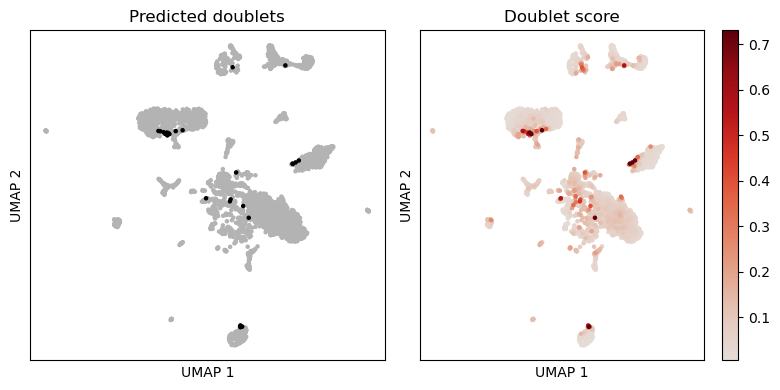

In [31]:
scrub.plot_embedding('UMAP', order_points=True);

In [20]:
scrub 

In [32]:
doublet_scores, predicted_doublets = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.52
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 7.6%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 2.5%
Elapsed time: 1.9 seconds


In [36]:
modified.obs['doublet_scores'] = doublet_scores
modified.obs['predicted_doublets'] = predicted_doublets


In [26]:
modified

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [37]:
modified.obs['predicted_doublets'].value_counts()

predicted_doublets
False    3152
True        6
Name: count, dtype: int64

In [39]:
# save the file
modified.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/modified_intersection_16_plates.h5ad")

In [1]:
import scanpy as sc
modified=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/modified_intersection_16_plates.h5ad")
modified

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [38]:
modified.obs['sex'] = ['male' if val > 0 else 'female' for val in introexon2[:, 'Uty'].X]


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


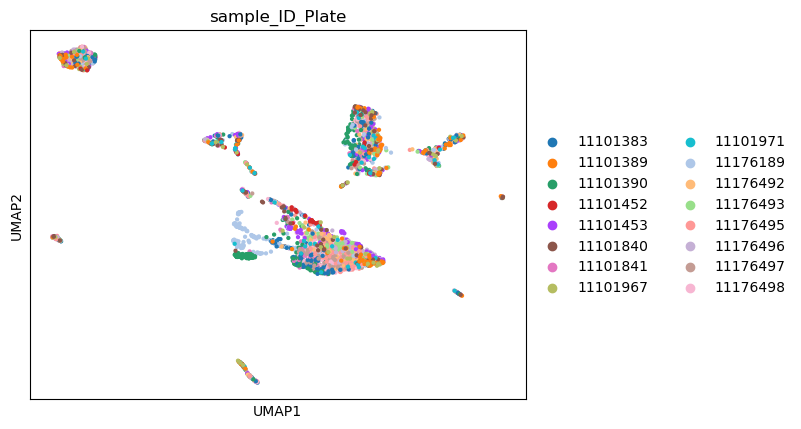

In [46]:
sc.pl.umap(modified, color=['sample_ID_Plate'], vmax='p95')

In [16]:
sc.tl.leiden(modified, resolution=0.8)
sc.tl.umap(modified,min_dist=0.2)

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packag

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


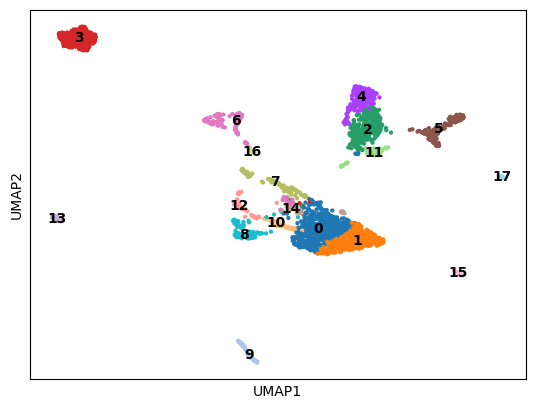

In [18]:
sc.pl.umap(modified, color=['leiden'], legend_loc='on data', title='')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


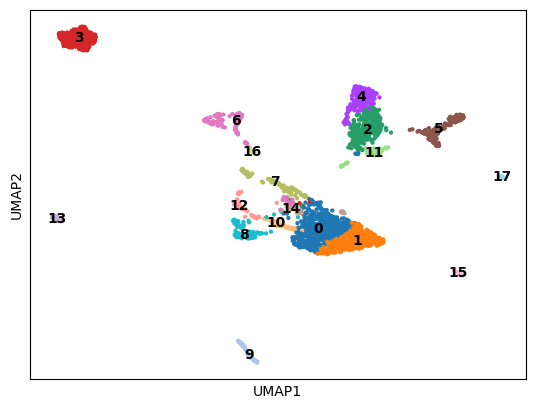

In [ ]:
sc.pl.umap(modified, color=['leiden'], legend_loc='on data', title='')

In [49]:
del modified.uns['log1p']

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldc

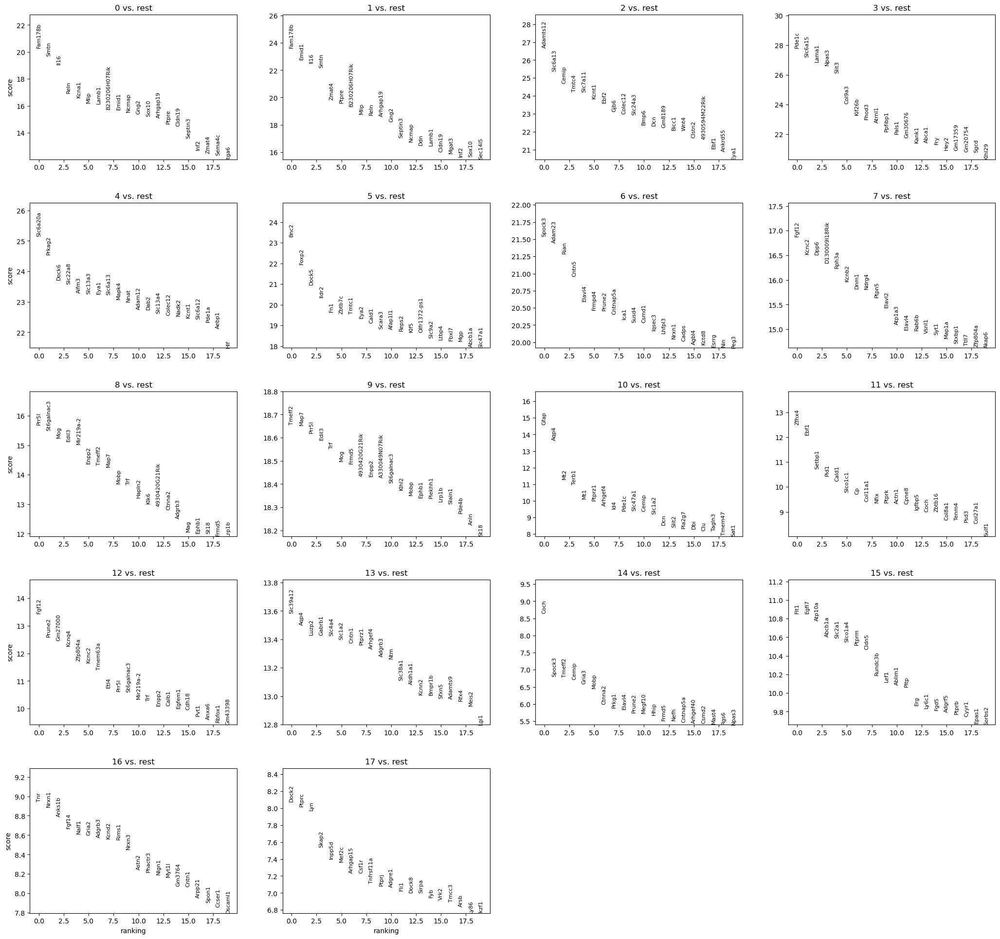

In [50]:
sc.pp.log1p(modified)
sc.tl.rank_genes_groups(modified, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(modified, n_genes=20, sharey=False)

In [75]:
import pandas as pd
#convert marker genes to dataframe
marker_genes=modified.uns['rank_genes_groups']['names']
marker_genes=pd.DataFrame(marker_genes)
marker_genes.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Fam178b,Fam178b,Adamts12,Pde1c,Slc6a20a,Bnc2,Spock3,Fgf12,Prr5l,Tmeff2,Gfap,Zfhx4,Fgf12,Slc39a12,Coch,Flt1,Tnr,Dock2
1,Smtn,Emid1,Slc6a13,Slc6a15,Prkag2,Foxp2,Adam23,Kcnc2,St6galnac3,Map7,Aqp4,Ebf1,Prune2,Aqp4,Spock3,Egfl7,Nrxn1,Ptprc
2,Il16,Il16,Cemip,Lama1,Dock6,Dock5,Rian,Dpp6,Mog,Prr5l,Mt2,Setbp1,Gm27000,Luzp2,Tmeff2,Atp10a,Anks1b,Lyn
3,Reln,Smtn,Tmtc4,Npas3,Slc22a8,Ildr2,Cntn5,D130009I18Rik,Edil3,Edil3,Terb1,Pid1,Kcnq4,Gabrb1,Cemip,Abcb1a,Fgf14,Skap2
4,Kcna1,Zmat4,Slc7a11,Slit3,Aifm3,Fn1,Elavl4,Rph3a,Mir219a-2,Trf,Mt1,Cald1,Zfp804a,Slc4a4,Gria3,Slc2a1,Nalf1,Inpp5d
5,Mlip,Ptpre,Kcnt1,Col9a3,Slc13a3,Zbtb7c,Frmpd4,Kcnb2,Enpp2,Mog,Ptprz1,Slco1c1,Kcnc2,Slc1a2,Mobp,Slco1a4,Gria2,Mef2c
6,Lamb1,B230206H07Rik,Ebf2,Kif26b,Eya1,Tmtc1,Prune2,Dnm1,Tmeff2,Frmd5,Arhgef4,Cp,Tmem63a,Cntn1,Ctnna2,Ptprm,Adgrb3,Arhgap15
7,B230206H07Rik,Mlip,Gjb6,Fhod3,Slc6a13,Eya2,Cntnap5a,Ndrg4,Map7,4930420G21Rik,Id4,Col11a1,Etl4,Ptprz1,Prkg1,Cldn5,Kcnd2,Csf1r
8,Emid1,Reln,Colec12,Atrnl1,Mapk4,Cald1,Ica1,Ptpn5,Mobp,Enpp2,Pde1c,Nfix,Prr5l,Arhgef4,Elavl4,Rundc3b,Rims1,Tnfrsf11a
9,Ncmap,Arhgap19,Slc24a3,Ppfibp1,Nnat,Scara3,Susd4,Elavl2,Trf,A330049N07Rik,Slc47a1,Ptprk,St6galnac3,Adgrb3,Prune2,Lef1,Nrxn3,Ptprj


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


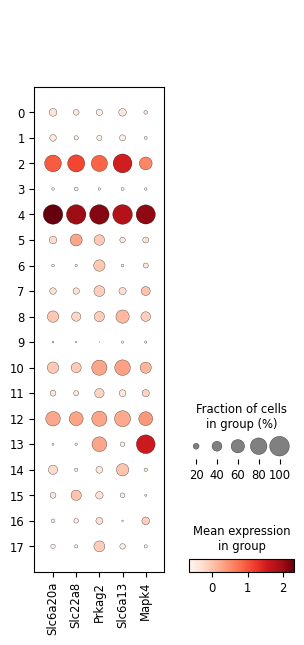

In [116]:
#show dotplot of Slc6a20a and Slc6a22a8

sc.pl.dotplot(modified, ['Slc6a20a','Slc22a8','Prkag2','Slc6a13','Mapk4'], groupby='leiden')

In [109]:
sc.pl.violin(modified, color=['Slc6a20a','Slc22a8'],groupby='leiden',jitter=0.4, multi_panel=True)

TypeError: violin() missing 1 required positional argument: 'keys'

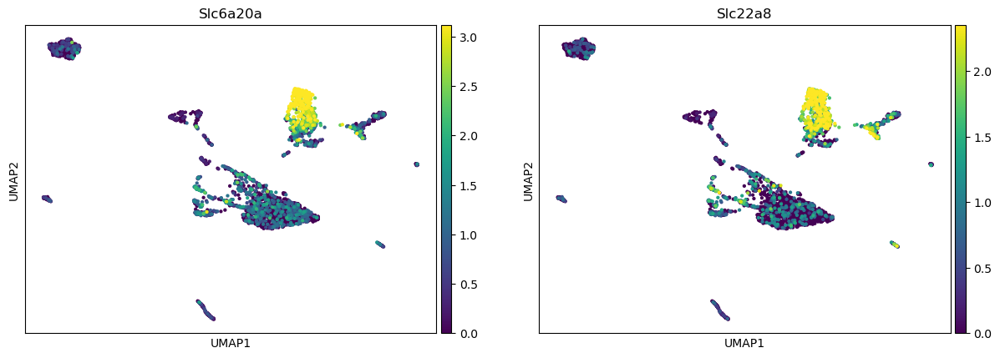

In [107]:
sc.pl.umap(modified, color=['Slc6a20a','Slc22a8'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


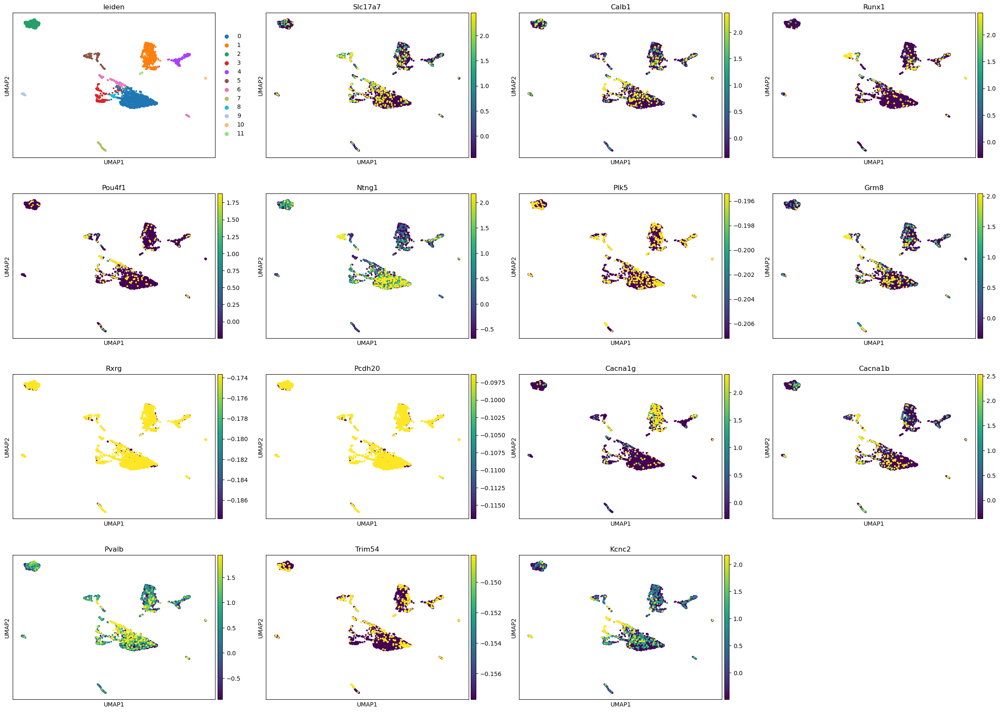

In [3]:
sc.pl.umap(modified, color=['leiden','Slc17a7','Calb1','Runx1','Pou4f1','Ntng1','Plk5','Grm8','Rxrg','Pcdh20','Cacna1g','Cacna1b','Pvalb','Trim54','Kcnc2'],vmax='p95')

In [4]:
modified.obs['leiden'].value_counts()

leiden
0     1070
1      696
2      308
3      227
4      206
5      193
6      168
7      122
8       66
9       63
10      22
11      17
Name: count, dtype: int64

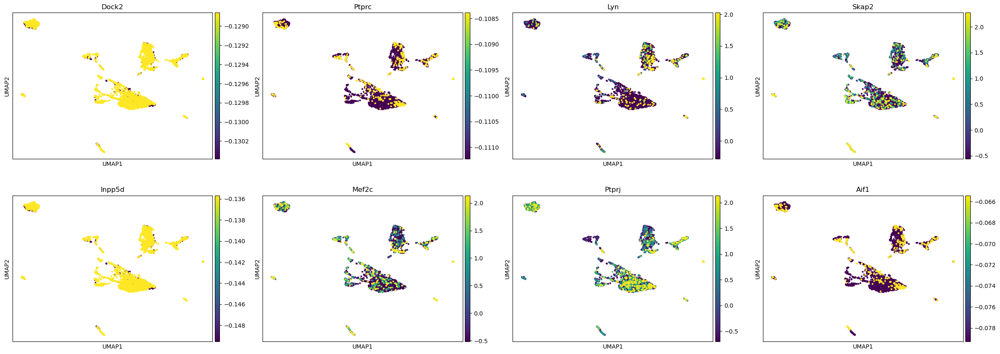

In [5]:
sc.pl.umap(modified, color=['Dock2','Ptprc','Lyn','Skap2','Inpp5d','Mef2c','Ptprj','Aif1'],vmax='p95')

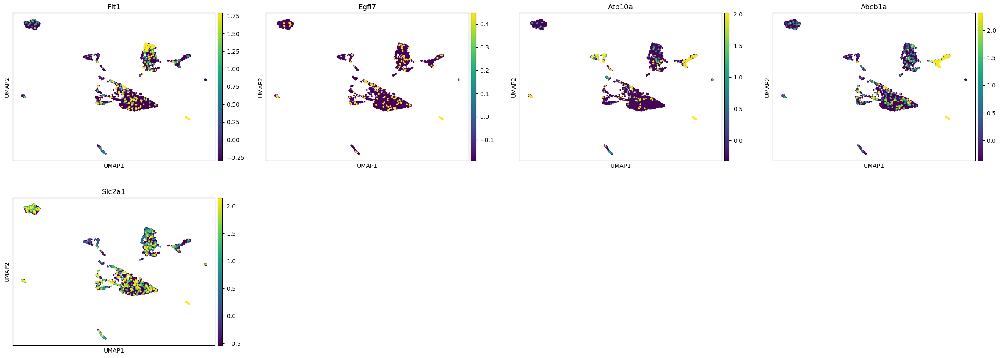

In [6]:
sc.pl.umap(modified, color=['Flt1','Egfl7','Atp10a','Abcb1a','Slc2a1'],vmax='p95')

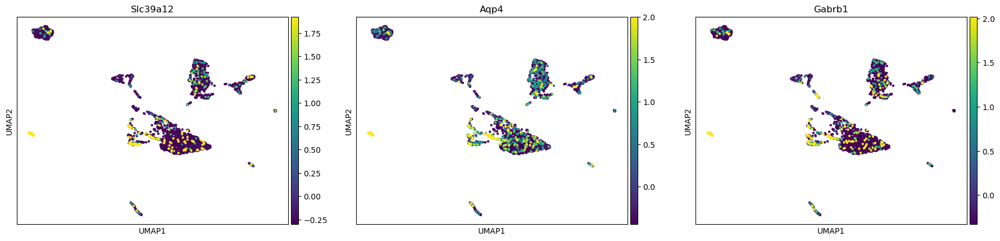

In [7]:
sc.pl.umap(modified, color=['Slc39a12','Aqp4','Gabrb1'],vmax='p95')

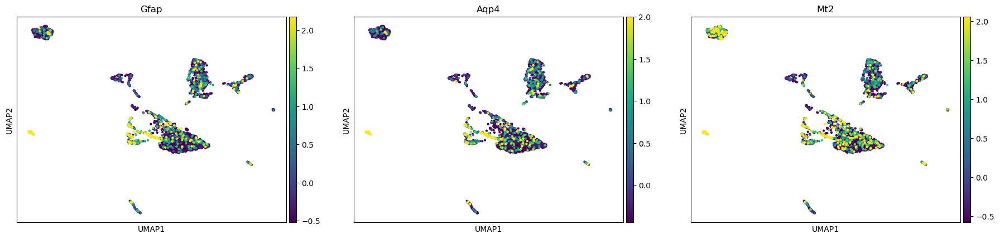

In [8]:
sc.pl.umap(modified, color=['Gfap','Aqp4','Mt2'],vmax='p95')

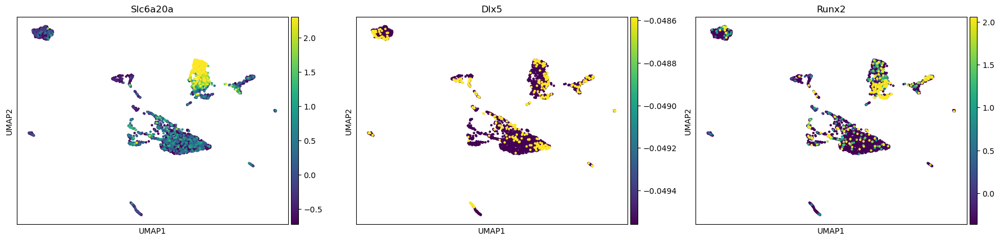

In [9]:
sc.pl.umap(modified, color=['Slc6a20a','Dlx5','Runx2'],vmax='p95')

In [19]:
modified.obs['leiden'].value_counts()

leiden
0     564
1     445
2     370
3     306
4     249
5     204
6     183
7     130
8     129
9     122
10     93
11     91
12     78
13     63
14     41
15     40
16     28
17     22
Name: count, dtype: int64

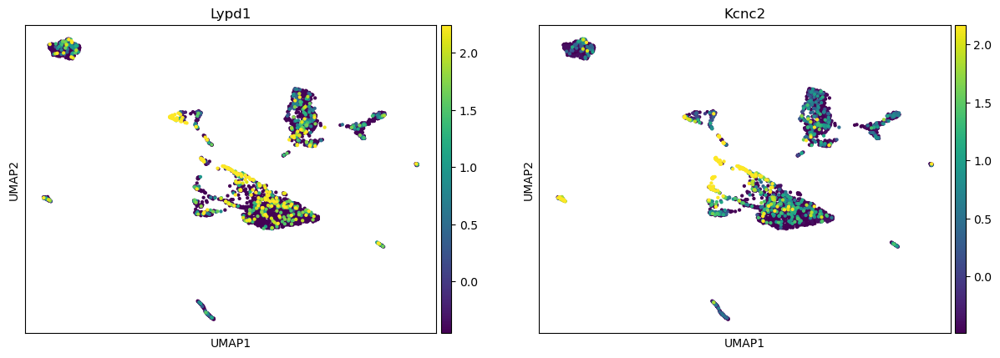

In [11]:
sc.pl.umap(modified,color=['Lypd1','Kcnc2'],legend_loc='on data',vmax='p95')

In [55]:
#modified.X = modified.layers['umi'].copy()
#sc.pp.normalize_total(modified, target_sum=None)
#sc.pp.log1p(modified)
#modified.layers['log1p'] = modified.X.copy()
sc.pp.scale(modified, max_value=10)
modified.layers['Scale'] = modified.X.copy()

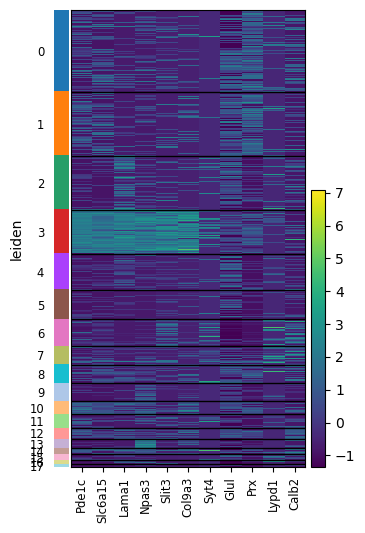

In [59]:
sc.pl.heatmap(modified,var_names=['Pde1c','Slc6a15','Lama1','Npas3','Slit3','Col9a3','Syt4','Glul','Prx','Lypd1','Calb2'],groupby='leiden',layer='Scale')

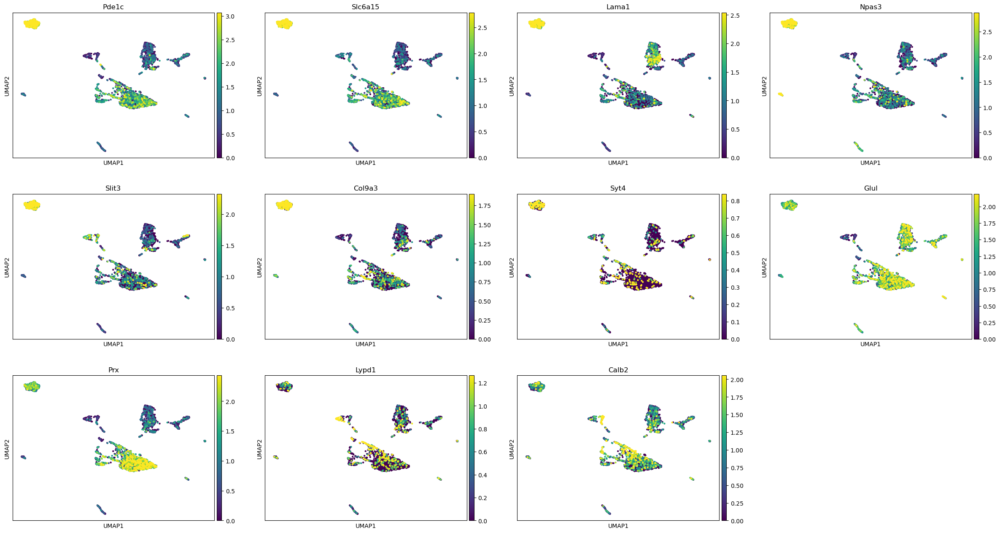

In [60]:
sc.pl.umap(modified,color=['Pde1c','Slc6a15','Lama1','Npas3','Slit3','Col9a3','Syt4','Glul','Prx','Lypd1','Calb2'],legend_loc='on data',layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


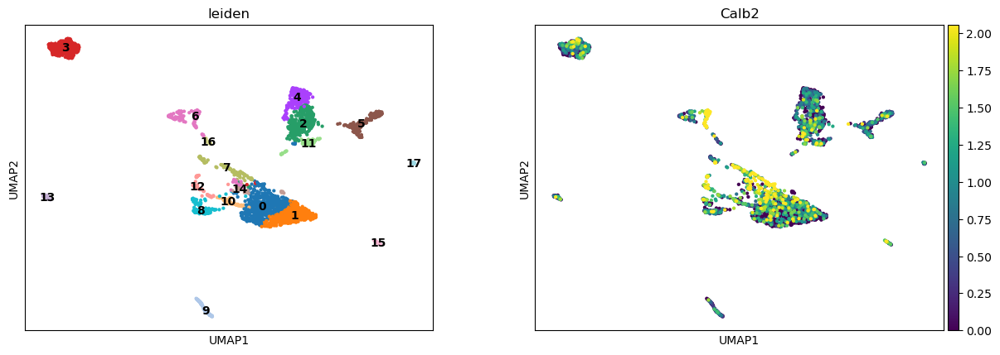

In [61]:
sc.pl.umap(modified,color=['leiden','Calb2'],legend_loc='on data',layer='log1p',vmax='p95')

In [14]:
modified

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

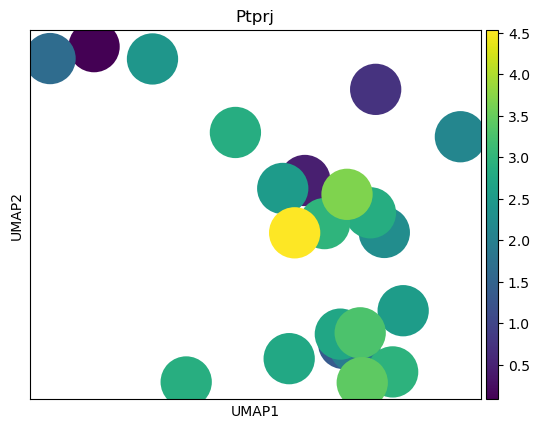

In [22]:
sc.pl.umap(modified[modified.obs['leiden'] == '17', :],color=['Ptprj'])

In [24]:
modified

AnnData object with n_obs × n_vars = 3158 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


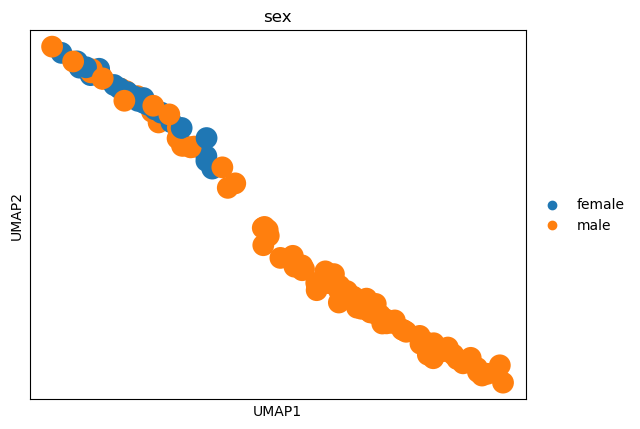

In [40]:
sc.pl.umap(modified[modified.obs['leiden'] == '9', :],color=['sex'])

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


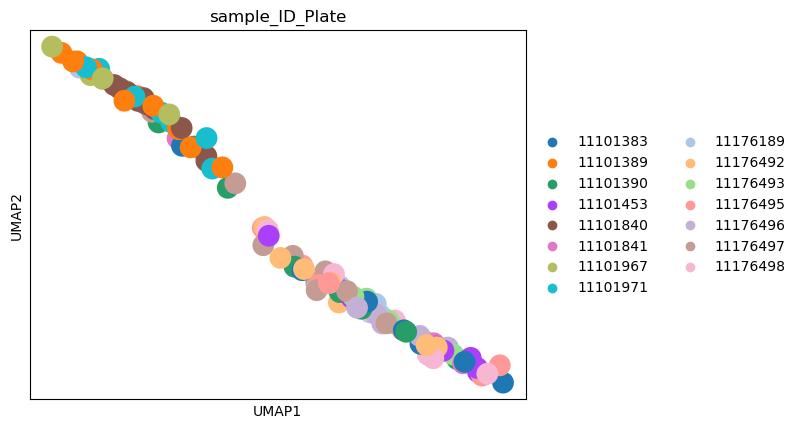

In [ ]:
sc.pl.umap(modified[modified.obs['leiden'] == '9', :],color=['sample_ID_Plate'])

In [62]:
#take subset leiden cluster 6,16,7 and 14
MaybeNeuron=modified[modified.obs['leiden'].isin(['6','16','7','14']),:]
MaybeNeuron

View of AnnData object with n_obs × n_vars = 382 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi', 'log1p', 'Scale'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


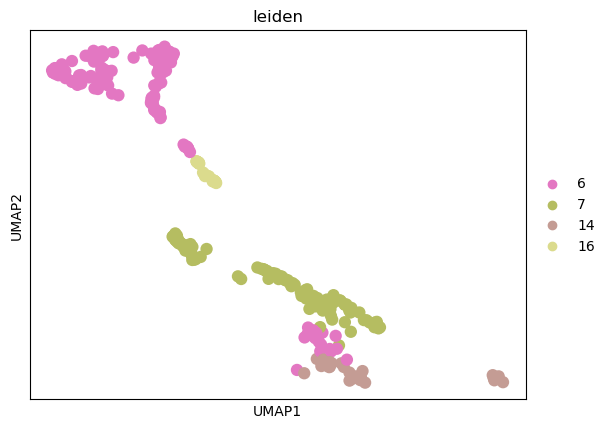

In [63]:
sc.pl.umap(MaybeNeuron,color='leiden')

In [64]:
MaybeNeuron.obs['leiden'].value_counts()

leiden
6     183
7     130
14     41
16     28
Name: count, dtype: int64

In [65]:
sc.tl.leiden(MaybeNeuron, resolution=0.8)
sc.tl.umap(MaybeNeuron,min_dist=0.2)

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


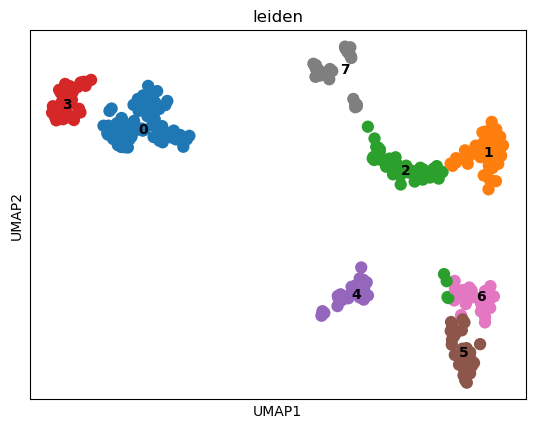

In [66]:
sc.pl.umap(MaybeNeuron,color='leiden',legend_loc='on data',layer='log1p',vmax='p95')

In [70]:
MaybeNeuron.obs['leiden'].value_counts()

leiden
0    83
1    56
2    49
3    45
4    41
5    37
6    36
7    35
Name: count, dtype: int64

In [67]:
MaybeNeuron

AnnData object with n_obs × n_vars = 382 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi', 'log1p', 'Scale'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


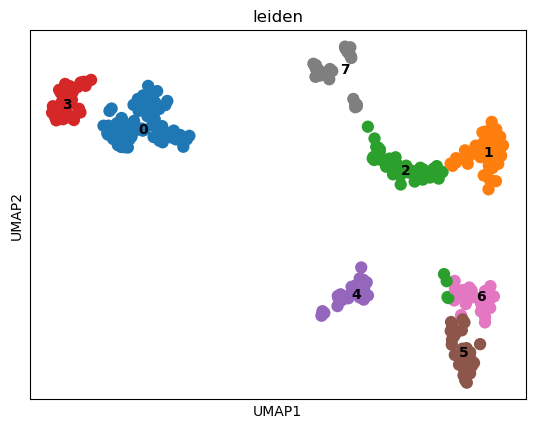

In [103]:
sc.pl.umap(MaybeNeuron,color=['leiden'],legend_loc='on data')

In [101]:
MaybeNeuron.obs['leiden'].value_counts()

leiden
0    83
1    56
2    49
3    45
4    41
5    37
6    36
7    35
Name: count, dtype: int64

In [78]:
# save MaybeNeuron
MaybeNeuron.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeuron.h5ad")

In [180]:
MaybeNeuron=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeuron.h5ad")

In [259]:
#From article Neuronal heterogeneity and stereotyped connectivity in the auditory afferent system 
neuron_cell_markers=['leiden','Slc17a7','Calb1','Runx1','Pou4f1','Grm8','Calb2','Trim54','Rxrg','Pcdh20','Prph','Plk5','Th','Cacna1g','Tubb3','Elavl3','Lypd1','Pcp4','Prox1','Snap25','Syp','Nefh','Pvalb','Slc17a8','Myo7a']

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


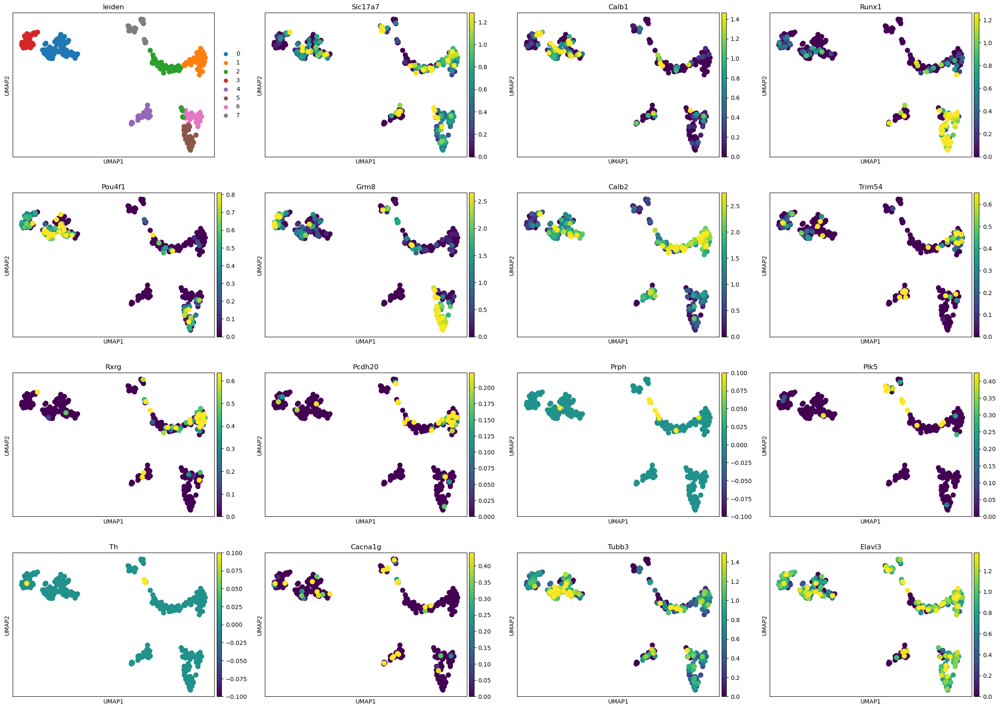

In [95]:
sc.pl.umap(MaybeNeuron,color=neuron_cell_markers,layer='log1p',vmax='p95',save='_MaybeNeuron.pdf')

In [ ]:
sc.pl.umap(Maybeneuron,color=['Lypd1','Pcp4','Prox1'],layer='log1p',vmax='p95')

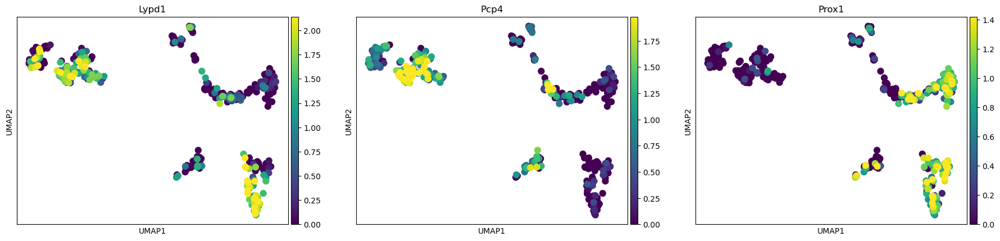

In [118]:
sc.pl.umap(MaybeNeuron[MaybeNeu],color=['Lypd1','Pcp4','Prox1'],layer='log1p',vmax='p95')

In [149]:
MaybeNeuron.obs['leiden'].value_counts()


leiden
0    83
1    56
2    49
3    45
4    41
5    37
6    36
7    35
Name: count, dtype: int64

In [148]:
MaybeNeruonnopcp4.obs['leiden'].value_counts()


leiden
0    83
1    56
3    45
4    41
5    37
6    36
7    35
2    34
Name: count, dtype: int64

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


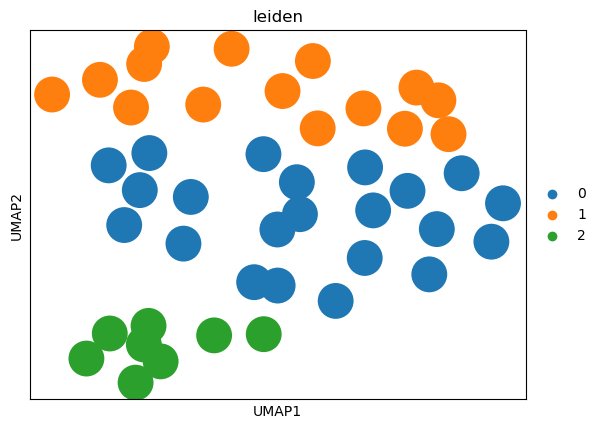

In [183]:
cluster2=MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '2']
sc.tl.leiden(cluster2, resolution=0.8)
sc.tl.umap(cluster2,min_dist=0.2)
sc.pl.umap(cluster2,color='leiden')
sc.pl.umap( luster2, color=['Pcp4','Prox1'],layer='log1p',vmax='p95')

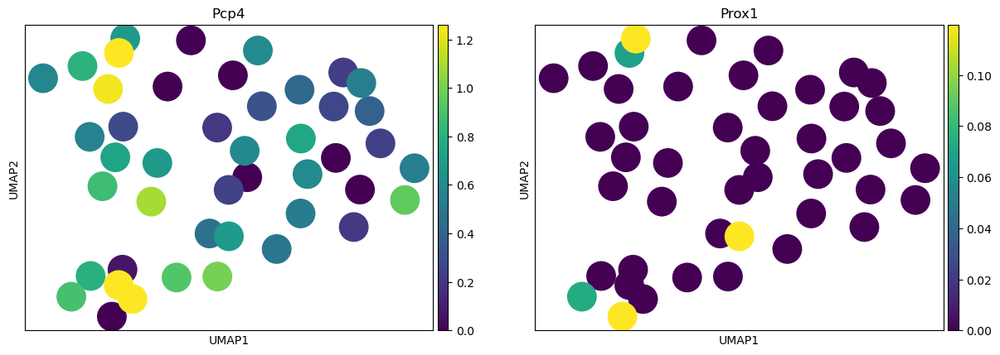

In [185]:
sc.pl.umap(cluster2, color=['Pcp4','Prox1'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


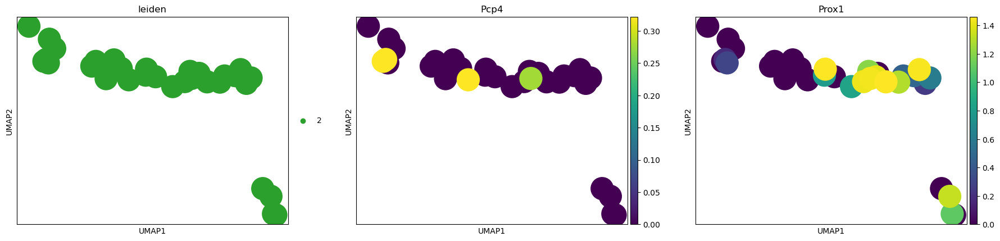

In [187]:
# Step 1: 创建一个布尔掩码标识出想要删除的细胞
cluster_2_indices = MaybeNeuron.obs['leiden'] == '2'
high_pcp4_cells = MaybeNeuron[cluster_2_indices, 'Pcp4'].layers['log1p'].toarray().flatten() > 0.5

# 注意: 这里我们要确保掩码的长度和MaybeNeuron的细胞数量一致
final_mask = np.ones(MaybeNeuron.n_obs, dtype=bool)
final_mask[np.where(cluster_2_indices)[0][high_pcp4_cells]] = False

# Step 2: 使用掩码更新MaybeNeuron对象
MaybeNeruonnopcp4 = MaybeNeuron[final_mask, :]

sc.pl.umap(MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '2'],color=['leiden','Pcp4','Prox1'],layer='log1p',vmax='p95')


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


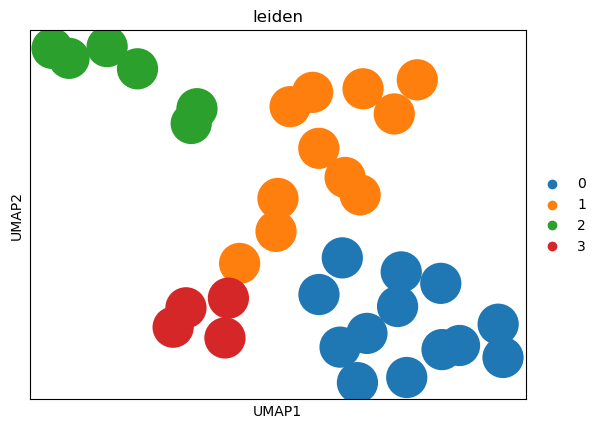

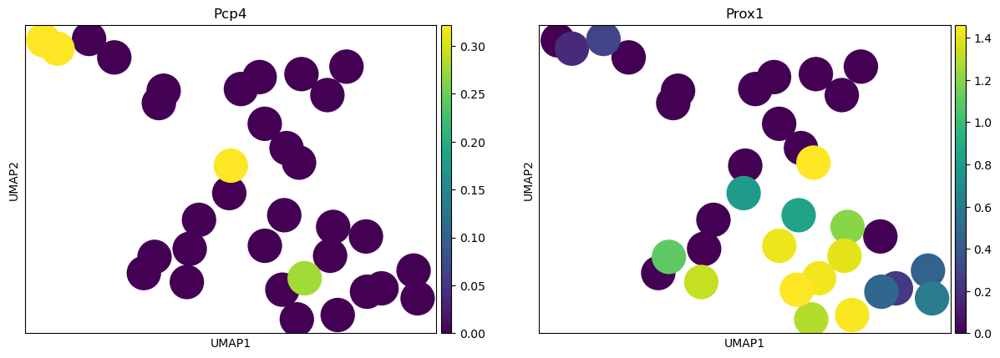

In [188]:
group_2_data = MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '2', :].copy()
sc.tl.leiden(group_2_data, resolution=0.8)
sc.tl.umap(group_2_data,min_dist=0.2)
sc.pl.umap(group_2_data,color='leiden')
sc.pl.umap(group_2_data, color=['Pcp4','Prox1'],layer='log1p',vmax='p95')


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


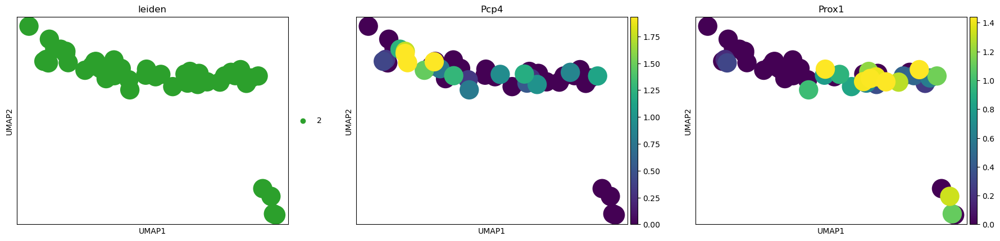

In [164]:
sc.pl.umap(MaybeNeuron[MaybeNeuron.obs['leiden'] == '2'],color=['leiden','Pcp4','Prox1'],layer='log1p',vmax='p95')

In [192]:
# Step 1: 为 leiden group 4 创建一个布尔掩码标识出想要删除的细胞
cluster_4_indices = MaybeNeruonnopcp4.obs['leiden'] == '4'
high_pcp4_cells_cluster_4 = MaybeNeruonnopcp4[cluster_4_indices, 'Pcp4'].layers['log1p'].toarray().flatten() > 0.4

# 注意: 这里我们要确保掩码的长度和MaybeNeuron的细胞数量一致
final_mask_cluster_4 = np.ones(MaybeNeruonnopcp4.n_obs, dtype=bool)
final_mask_cluster_4[np.where(cluster_4_indices)[0][high_pcp4_cells_cluster_4]] = False

# Step 2: 使用掩码更新MaybeNeuron对象
MaybeNeruonnopcp4 = MaybeNeruonnopcp4[final_mask_cluster_4, :]


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


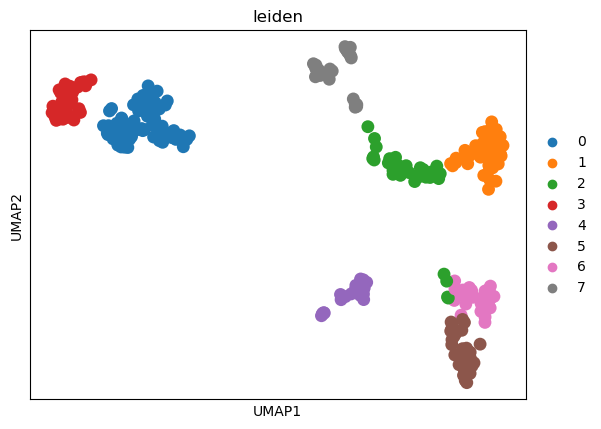

In [197]:
sc.pl.umap(MaybeNeruonnopcp4,color=['leiden'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


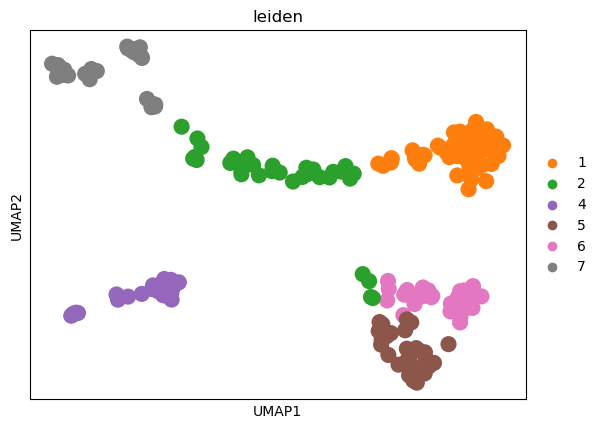

In [198]:
# Step 1: 创建一个布尔掩码，标识出 leiden cluster 0 和 3
clusters_to_remove = ['0', '3']
remove_mask = MaybeNeruonnopcp4.obs['leiden'].isin(clusters_to_remove)

# 反转掩码（即~remove_mask）来获得你想要保留的细胞
keep_mask = ~remove_mask

# Step 2: 使用掩码更新MaybeNeruonnopcp4对象
MaybeNeruonnopcp4_filtered = MaybeNeruonnopcp4[keep_mask, :]

# 可视化结果
sc.pl.umap(MaybeNeruonnopcp4_filtered, color='leiden', layer='log1p', vmax='p95')


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


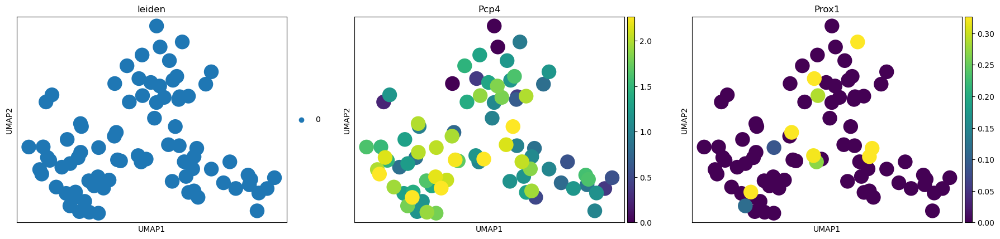

In [196]:
sc.pl.umap(MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '0'],color=['leiden','Pcp4','Prox1'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


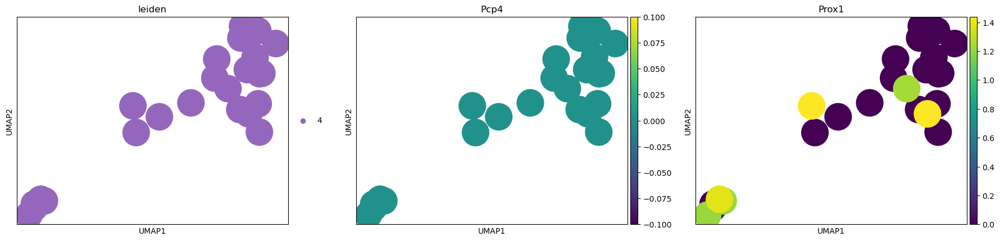

In [193]:
sc.pl.umap(MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '4'],color=['leiden','Pcp4','Prox1'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


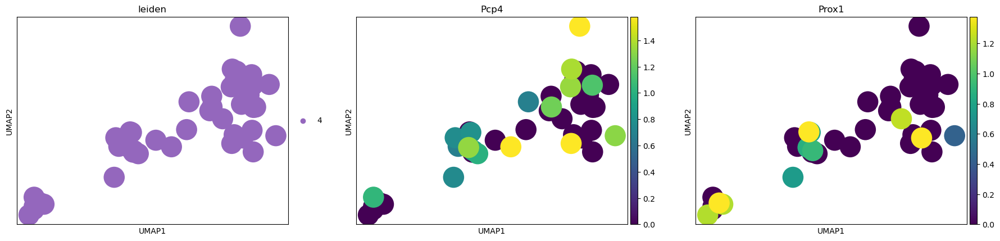

In [194]:
sc.pl.umap(MaybeNeuron[MaybeNeuron.obs['leiden'] == '4'],color=['leiden','Pcp4','Prox1'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


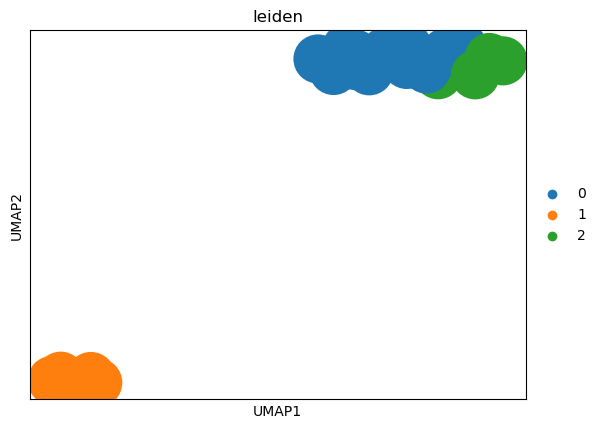

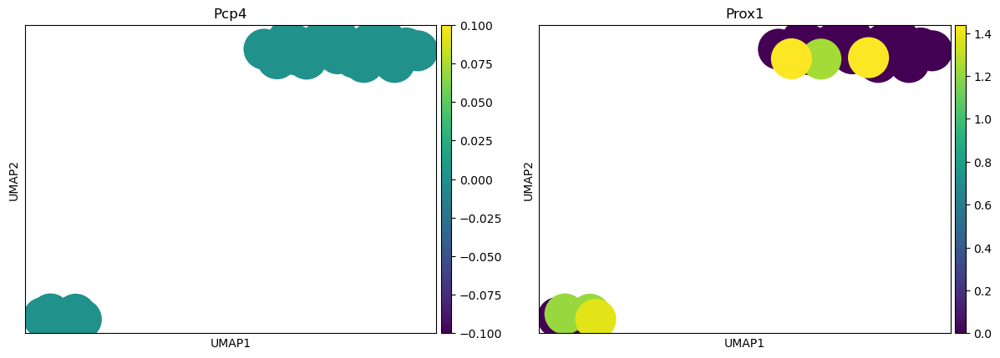

In [199]:
group_4_data = MaybeNeruonnopcp4[MaybeNeruonnopcp4.obs['leiden'] == '4', :].copy()
sc.tl.leiden(group_4_data, resolution=0.8)
sc.tl.umap(group_4_data,min_dist=0.2)
sc.pl.umap(group_4_data,color='leiden')
sc.pl.umap(group_4_data, color=['Pcp4','Prox1'],layer='log1p',vmax='p95')


In [176]:
# save MaybeNeruonnopcp4 
MaybeNeruonnopcp4.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4.h5ad")

In [172]:
MaybeNeuron.obs['leiden'].value_counts()

leiden
0    83
1    56
2    49
3    45
4    41
5    37
6    36
7    35
Name: count, dtype: int64

In [173]:
MaybeNeruonnopcp4.obs['leiden'].value_counts()

leiden
0    83
1    56
3    45
5    37
6    36
7    35
2    34
4    24
Name: count, dtype: int64

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


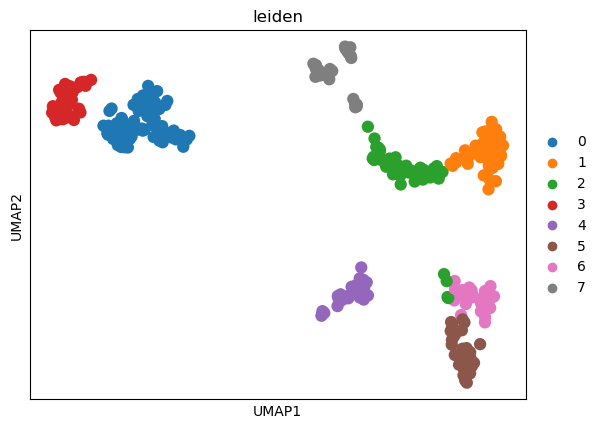

In [181]:
sc.pl.umap(MaybeNeuron,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


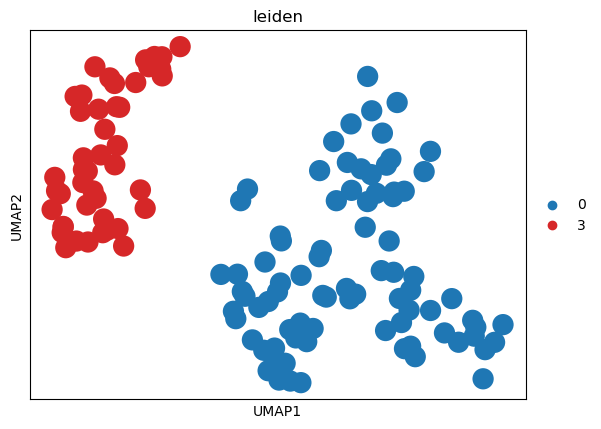

In [230]:
MaybeNeurononly1_3=MaybeNeuron[MaybeNeuron.obs['leiden'].isin(['0','3']),:]
sc.pl.umap(MaybeNeurononly1_3,color='leiden')

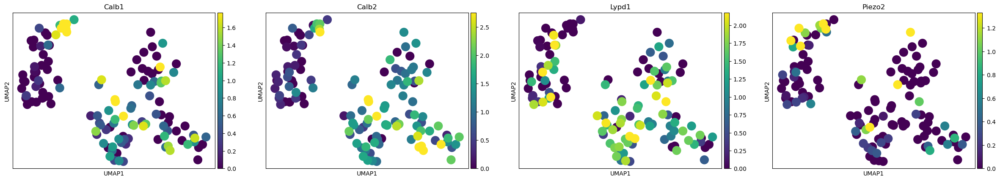

In [233]:
sc.pl.umap(MaybeNeurononly1_3,color=['Calb1','Calb2','Lypd1','Piezo2'],layer='log1p',vmax='p95')

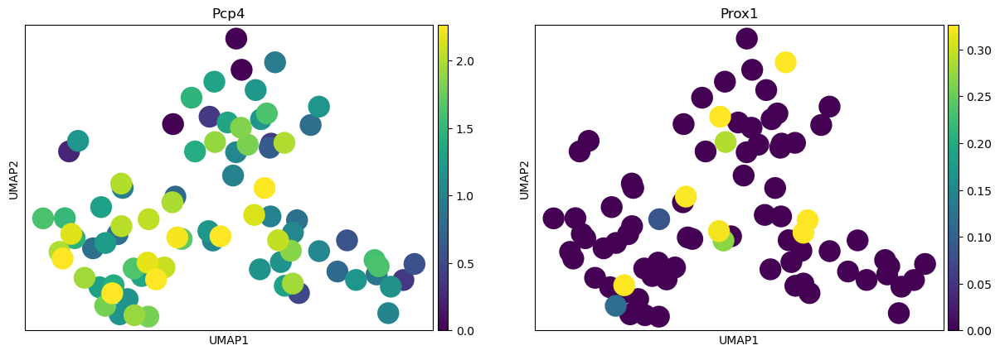

In [228]:
sc.pl.umap(MaybeNeurononly0,color=['Pcp4','Prox1'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


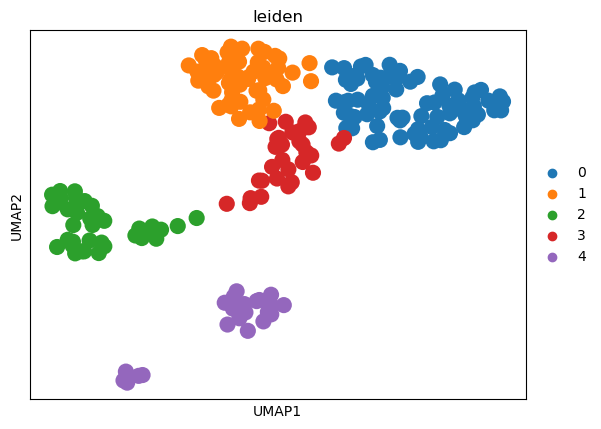

In [243]:
sc.tl.leiden(MaybeNeruonnopcp4_filtered, resolution=0.4)
sc.tl.umap(MaybeNeruonnopcp4_filtered,min_dist=0.9)
sc.pl.umap(MaybeNeruonnopcp4_filtered,color='leiden')

In [238]:
MaybeNeruonnopcp4_filtered.obs['leiden'].value_counts()

leiden
0    77
1    56
2    52
3    37
Name: count, dtype: int64

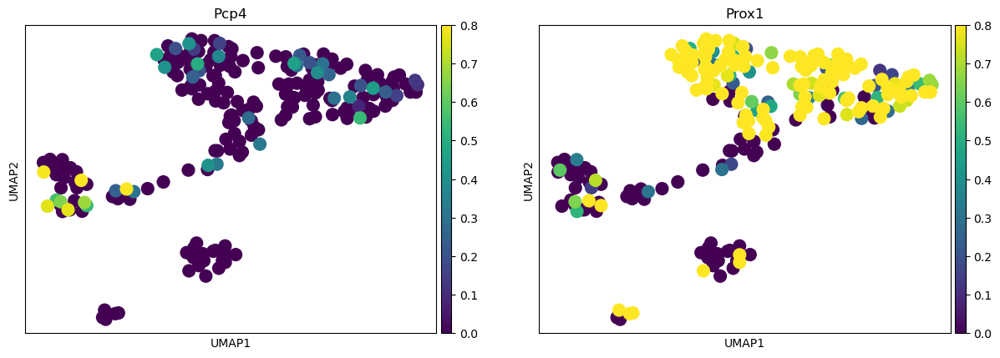

In [249]:
sc.pl.umap(MaybeNeruonnopcp4_filtered,color=['Pcp4','Prox1'],layer='log1p',vmax=0.8)

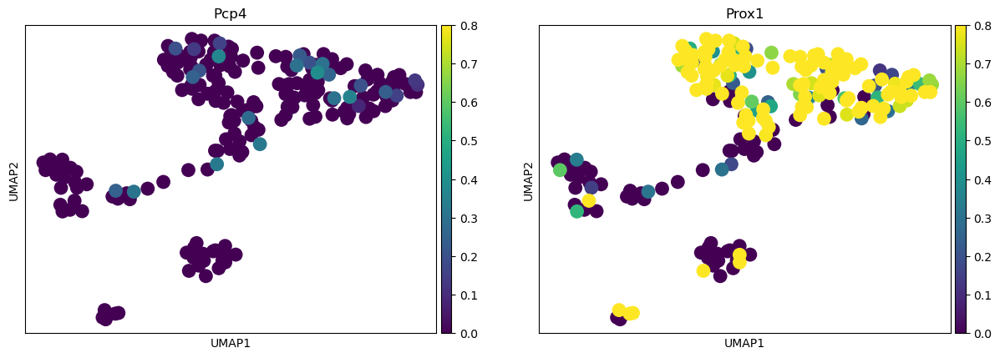

In [252]:
high_pcp4_cells = MaybeNeruonnopcp4_filtered[:, 'Pcp4'].layers['log1p'].toarray().flatten() > 0.4

final_mask = ~high_pcp4_cells

MaybeNeruonnopcp4_filtered_nopcp4 = MaybeNeruonnopcp4_filtered[final_mask, :]

sc.pl.umap(MaybeNeruonnopcp4_filtered_nopcp4, color=['Pcp4', 'Prox1'], layer='log1p', vmax=0.8)


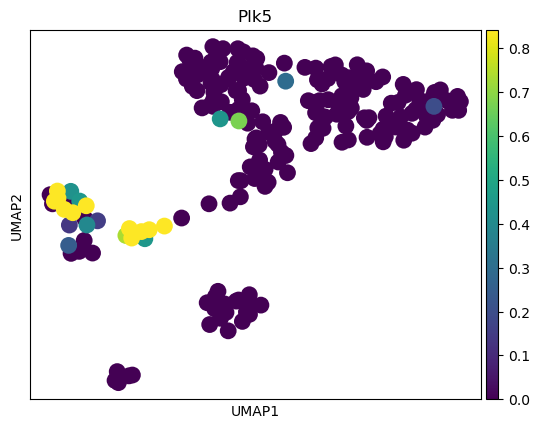

In [253]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_nopcp4, color=['Plk5'], layer='log1p', vmax='p95')

In [254]:
MaybeNeruonnopcp4_filtered_nopcp4.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4_filtered_nopcp4.h5ad")

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


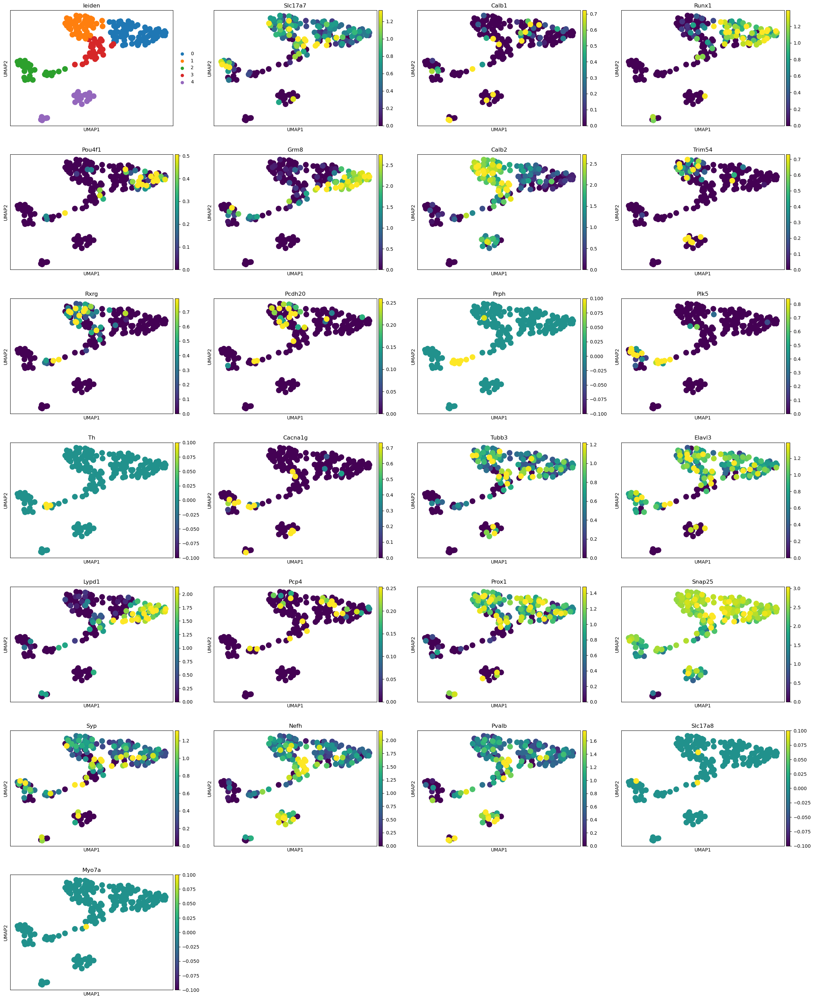

In [260]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_nopcp4,color=neuron_cell_markers,layer='log1p',vmax='p95',save='_MaybeNeuron.pdf')

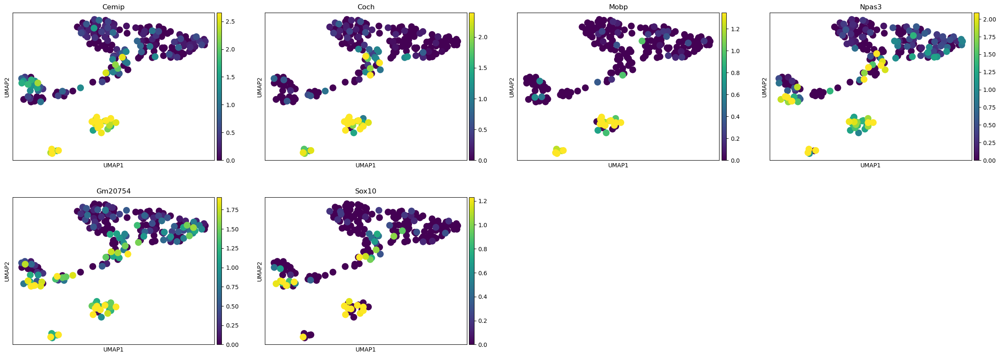

In [270]:
sc.pl.umap(MaybeNeruonnopcp4_filtered,color=['Cemip','Coch','Mobp','Npas3','Gm20754','Sox10'],layer='log1p',vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


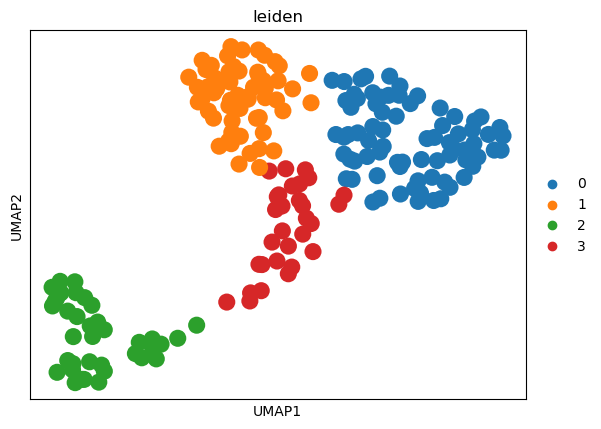

In [269]:
# remove cluster 4
MaybeNeruonnopcp4_filtered_no4=MaybeNeruonnopcp4_filtered[MaybeNeruonnopcp4_filtered.obs['leiden'].isin(['0','1','2','3']),:]
sc.pl.umap(MaybeNeruonnopcp4_filtered_no4,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


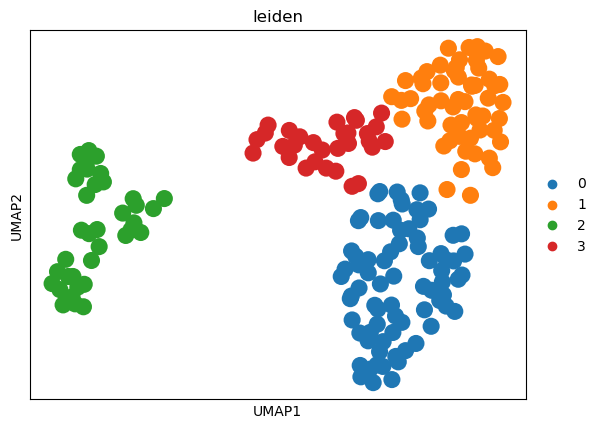

In [278]:
sc.tl.leiden(MaybeNeruonnopcp4_filtered_no4, resolution=0.4)
sc.tl.umap(MaybeNeruonnopcp4_filtered_no4,min_dist=0.8)
sc.pl.umap(MaybeNeruonnopcp4_filtered_no4,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


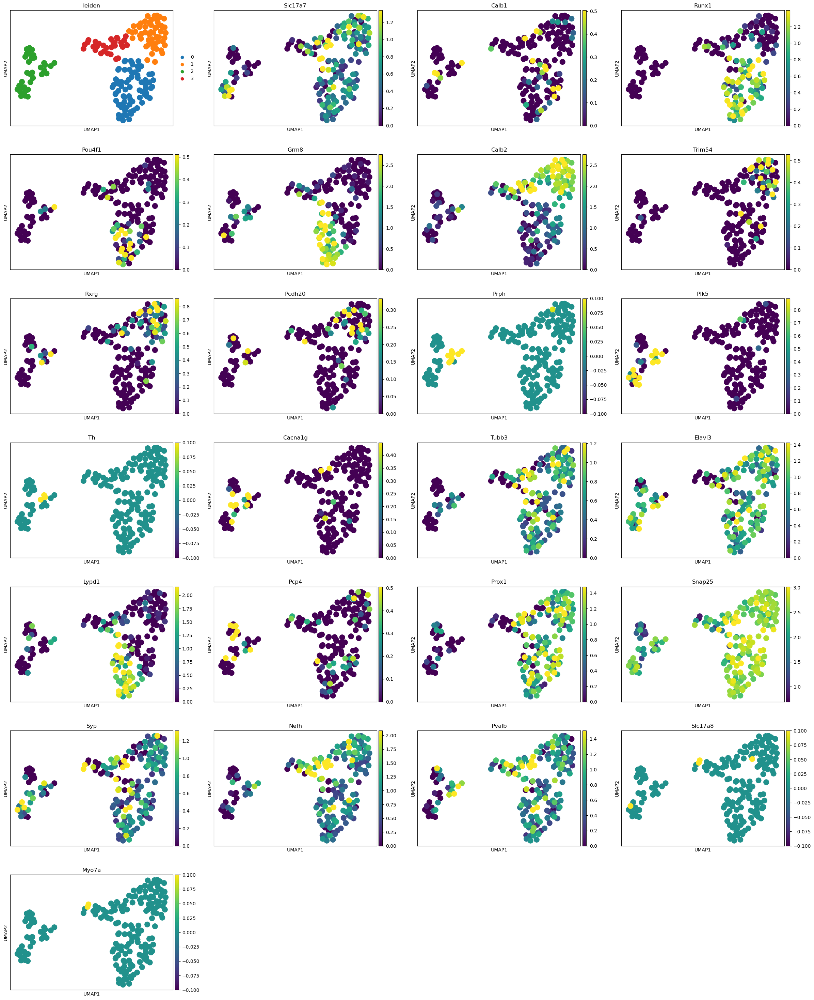

In [279]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_no4,color=neuron_cell_markers,layer='log1p',vmax='p95',save='MaybeNeruonnopcp4_filtered_no4.pdf')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


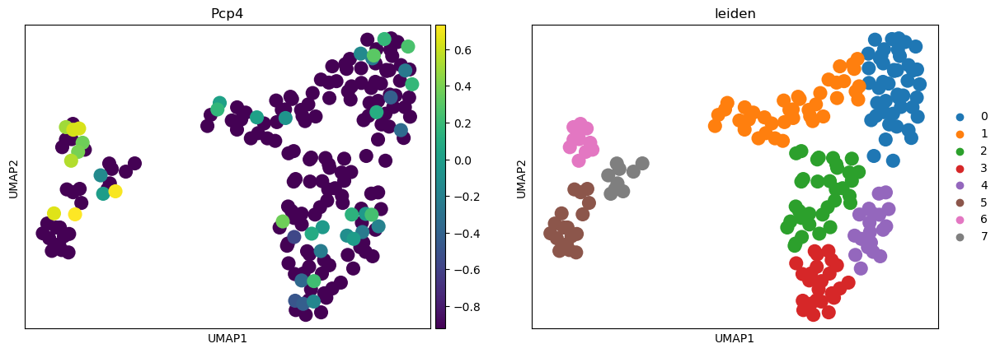

In [283]:
MaybeNeruonnopcp4_filtered_noPCP4=MaybeNeruonnopcp4_filtered_no4.copy()
sc.tl.leiden(MaybeNeruonnopcp4_filtered_noPCP4, resolution=0.9)
sc.tl.umap(MaybeNeruonnopcp4_filtered_noPCP4,min_dist=0.8)
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4,color=['Pcp4','leiden'])

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


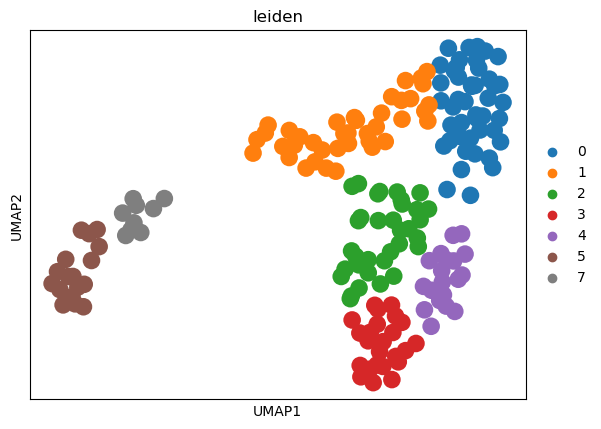

In [284]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink=MaybeNeruonnopcp4_filtered_noPCP4[MaybeNeruonnopcp4_filtered_noPCP4.obs['leiden'].isin(['0','1','2','3','4','5','7']),:]
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


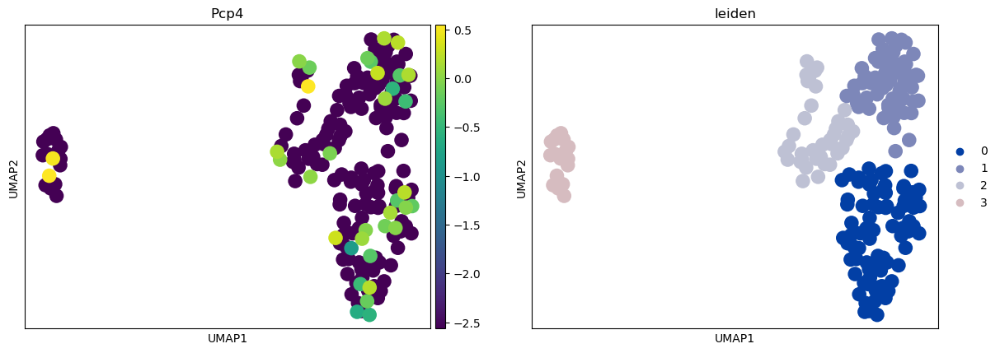

In [306]:
sc.tl.leiden(MaybeNeruonnopcp4_filtered_noPCP4_no_pink, resolution=0.3)
sc.tl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink,min_dist=0.8)
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink,color=['Pcp4','leiden'])

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


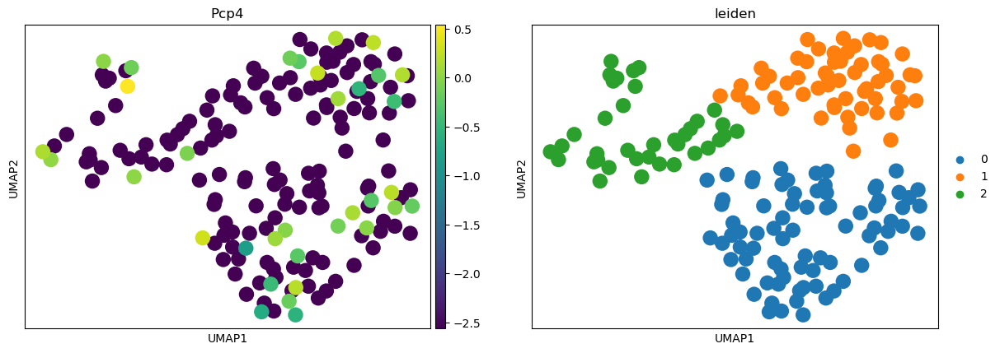

In [307]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue=MaybeNeruonnopcp4_filtered_noPCP4_no_pink[MaybeNeruonnopcp4_filtered_noPCP4_no_pink.obs['leiden'].isin(['0','1','2']),:]
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Pcp4','leiden'])

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


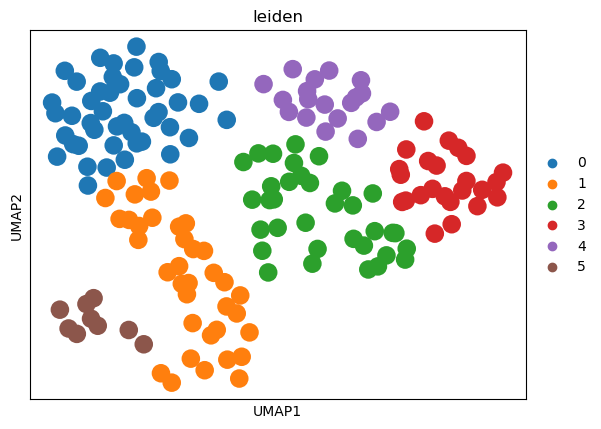

In [320]:
sc.tl.leiden(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue, resolution=0.8)
sc.tl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,min_dist=0.8)
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color='leiden')

In [288]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4_filtered_noPCP4_no_pink.h5ad")

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


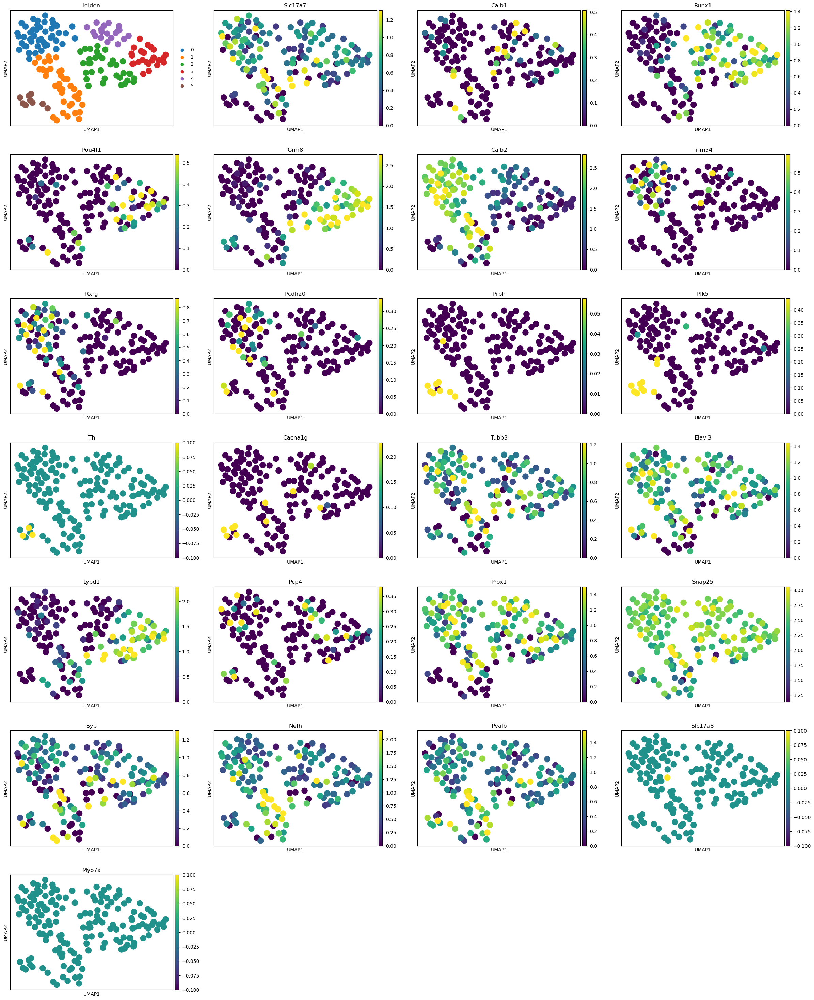

In [321]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=neuron_cell_markers,layer='log1p',vmax='p95',save='_MaybeNeuron3.pdf')

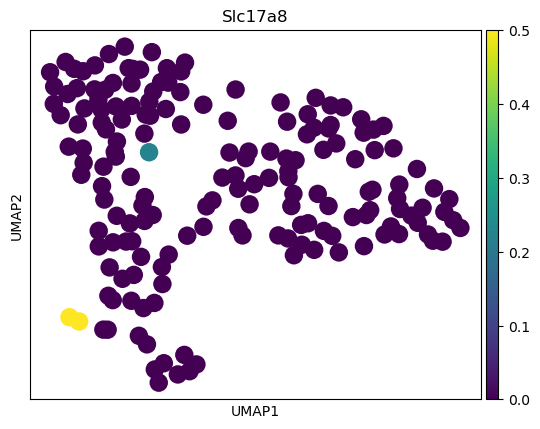

In [314]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color='Slc17a8',layer='log1p',vmax=0.5)

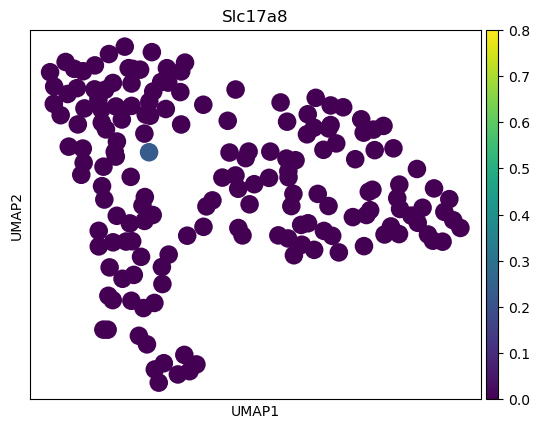

In [315]:
high_slc17a8_cells = MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue[:, 'Slc17a8'].layers['log1p'].toarray().flatten() > 0.35

final_mask = ~high_slc17a8_cells

MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue = MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue[final_mask, :]

sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue, color=['Slc17a8'], layer='log1p', vmax=0.8)


In [263]:
del MaybeNeruonnopcp4_filtered_noPCP4_no_pink.uns['log1p']

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldc

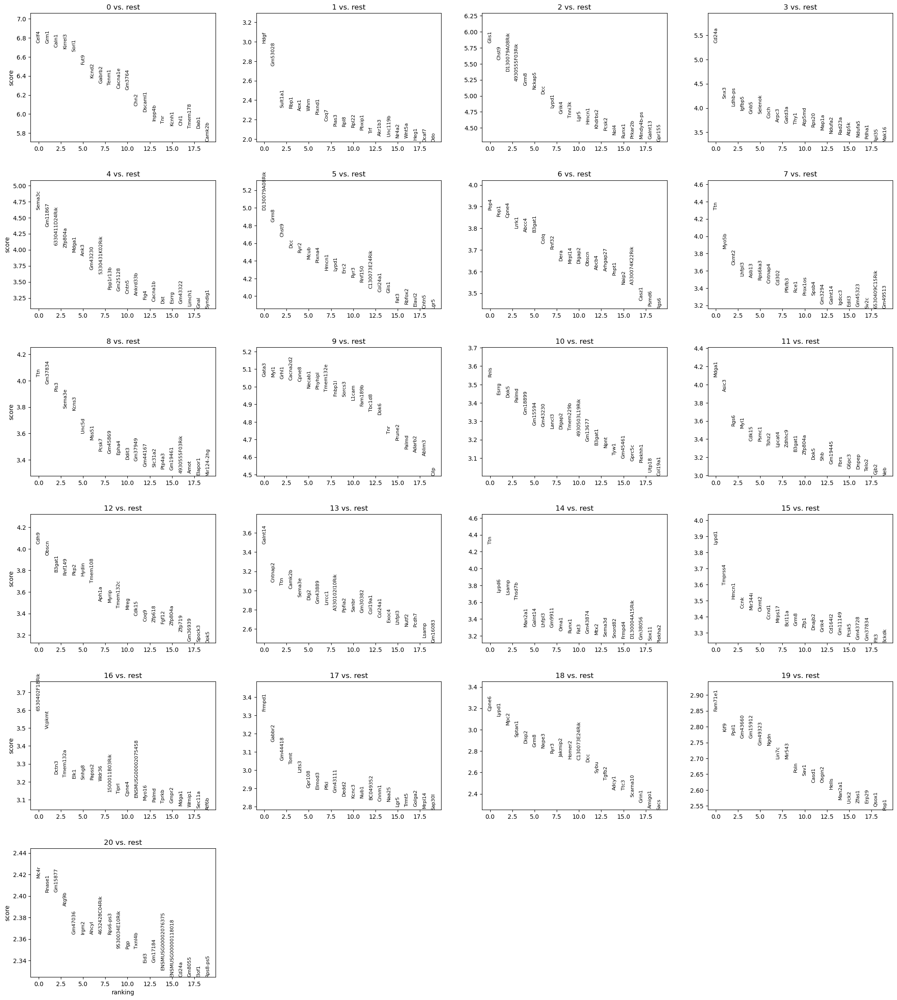

In [301]:
sc.pp.log1p(MaybeNeruonnopcp4_filtered_noPCP4_no_pink)
sc.tl.rank_genes_groups(MaybeNeruonnopcp4_filtered_noPCP4_no_pink, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(MaybeNeruonnopcp4_filtered_noPCP4_no_pink, n_genes=20, sharey=False)

In [302]:
import pandas as pd
#convert marker genes to dataframe
marker_genes=MaybeNeruonnopcp4_filtered_noPCP4_no_pink.uns['rank_genes_groups']['names']
marker_genes=pd.DataFrame(marker_genes)
marker_genes.head(20)

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,Celf4,Hdgf,Glis1,Cd24a,Sema3c,D130079A08Rik,Pop4,Ttn,Ttn,Gata3,...,Mdga1,Cdh9,Galnt14,Ttn,Lypd1,6530402F18Rik,Frmpd1,Cpne6,Fam71e1,Mc4r
1,Grm1,Gm53028,Chst9,Snx3,Gm11867,Grm8,Pop1,Myo5b,Gm37834,Myl1,...,Asic3,Obscn,Cntnap2,Lypd6,Tmprss4,Vcpkmt,Gabbr2,Lypd1,Kif9,Rnase1
2,Caln1,Sult1a1,D130079A08Rik,Ldhb-ps,6330411D24Rik,Chst9,Cpne4,Ckmt2,Pls3,Grhl1,...,Rgs6,B3gat1,Ttn,Lsamp,Hmcn1,Dctn3,Gm44418,Mpc2,Ppil1,Gm15877
3,Kirrel3,Rbp1,4930555F03Rik,Igfbp5,Zfp804a,Dcc,Lrrk1,Lhfpl3,Sema3e,Cacna2d2,...,Myl1,Rnf149,Camk2b,Thsd7b,Ccnk,Tmem132a,Tomt,Sptan1,Gm43660,Atg9b
4,Sorl1,Aox1,Grm8,Gnb5,Mdga1,Ryr2,Abcc4,Asb13,Kcns3,Cpne8,...,Cdk15,Pkp2,Sema3e,Man2a1,Mir344i,Elk1,Lzts3,Disp2,Gm15912,Gm47036
5,Fut9,Whrn,Nckap5,Selenok,Ank3,Mcub,B3gat1,Rps6ka3,Unc5d,Necab1,...,Psmc1,Hydin,Dlg2,Galnt14,Ckmt2,Snhg8,Gpr108,Grm8,Gm49323,Irgm2
6,Kcnd2,Plxnd1,Dcc,Coch,Gm43230,Plxna4,Colq,Cntnap4,Mss51,Phyhipl,...,Tshz2,Tmem108,Gm43889,Lhfpl3,Ccnd1,Papss2,Elmod3,Nxpe3,Ngdn,Ahcyl
7,Gabrb2,Coq7,Lypd1,Arpc3,5330431K02Rik,Hmcn1,Rnf32,Cd302,Pcsk7,Tmem132e,...,Lpcat4,Aph1a,Lrrcc1,Gm9911,Mrps17,Wdr36,Pfkl,Ryr3,Lin7c,4632428C04Rik
8,Tenm1,Pias3,Grik4,Gatd3a,Ppp1r13b,Lypd1,Dera,Pfkfb3,Gm45869,Fnbp1l,...,Zdhhc9,Myrip,A330102I10Rik,Oma1,Bcl11a,1500011B03Rik,Gm43111,Jakmip2,Mir543,Rps6-ps3
9,Cacna1e,Rpl8,Tnni3k,Thy1,Gm25128,Erc2,Mrpl14,Rce1,Epha4,Sorcs3,...,B3gat1,Tmem132c,Ppfia2,Runx1,Grm8,Tiprl,Dedd2,Homer2,Poln,9530034E10Rik


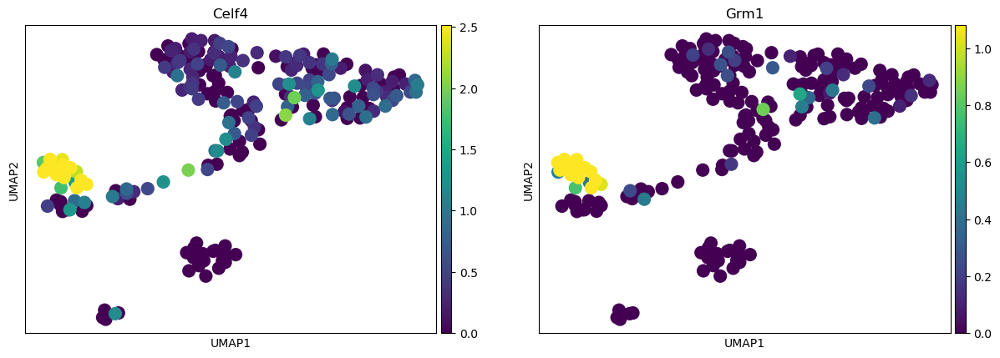

In [304]:
sc.pl.umap(MaybeNeruonnopcp4_filtered,color=['Celf4','Grm1'],layer='log1p',vmax='p95')

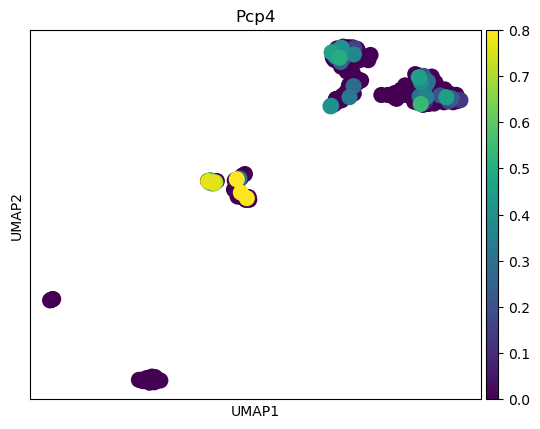

In [222]:
sc.pl.umap(MaybeNeruonnopcp4_filtered,color='Pcp4',layer='log1p',vmax=0.8,vmin=0)

In [208]:
MaybeNeruonnopcp4_filtered_no1_2_3

View of AnnData object with n_obs × n_vars = 161 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Scale', 'log1p', 'umi'
    obsp: 'connectivities', 'distances'

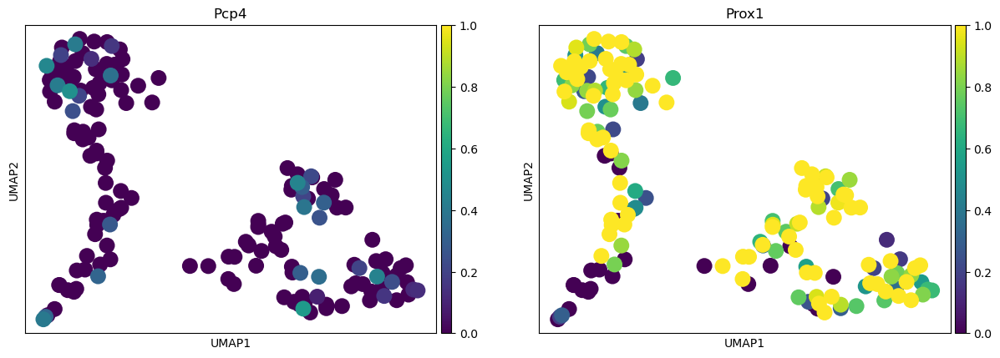

In [220]:

sc.pl.umap(MaybeNeruonnopcp4_filtered_no1_2_3,color=['Pcp4','Prox1'],vmax=1,layer='log1p',vmin=0)

In [219]:
MaybeNeruonnopcp4_filtered_no1_2_3

View of AnnData object with n_obs × n_vars = 161 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Scale', 'log1p', 'umi'
    obsp: 'connectivities', 'distances'

UMAP for Type1:


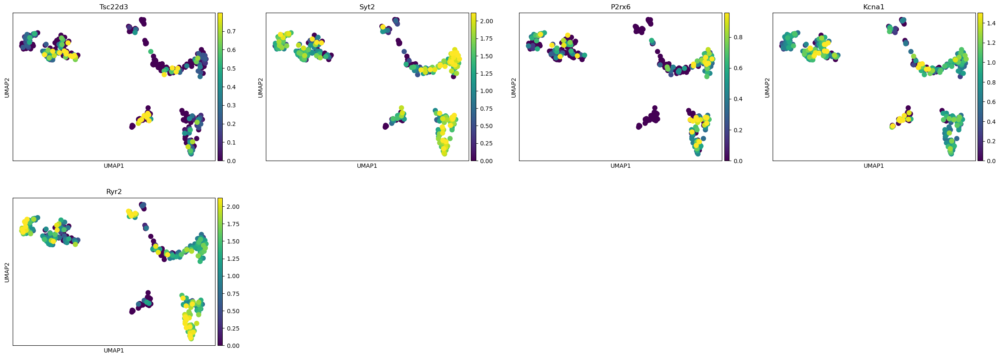

UMAP for Type2:


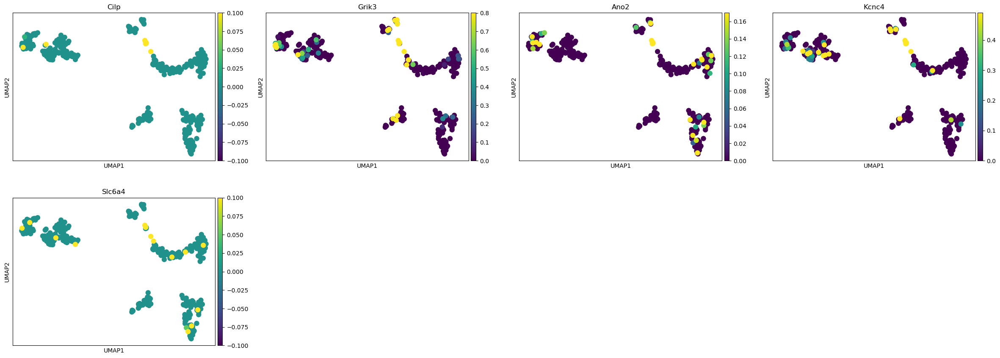

Not found genes: []


In [99]:
not_found_genes = []

New_markers = {
    'Type1': ['Tsc22d3', 'Syt2', 'P2rx6', 'Kcna1', 'Ryr2'],
    'Type2': ['Cilp', 'Grik3', 'Ano2', 'Kcnc4', 'Slc6a4']
}

for cell_type, markers in New_markers.items():
    print(f"UMAP for {cell_type}:")
    
    valid_markers = []
    for marker in markers:
        if marker in MaybeNeuron.var_names:
            valid_markers.append(marker)
        else:
            print(f"Gene {marker} not found.")
            not_found_genes.append(marker)
    
    if valid_markers:
        sc.pl.umap(MaybeNeuron, color=valid_markers, vmax='p95', layer='log1p', save=f'_{cell_type}.pdf')

print("Not found genes:", not_found_genes)


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

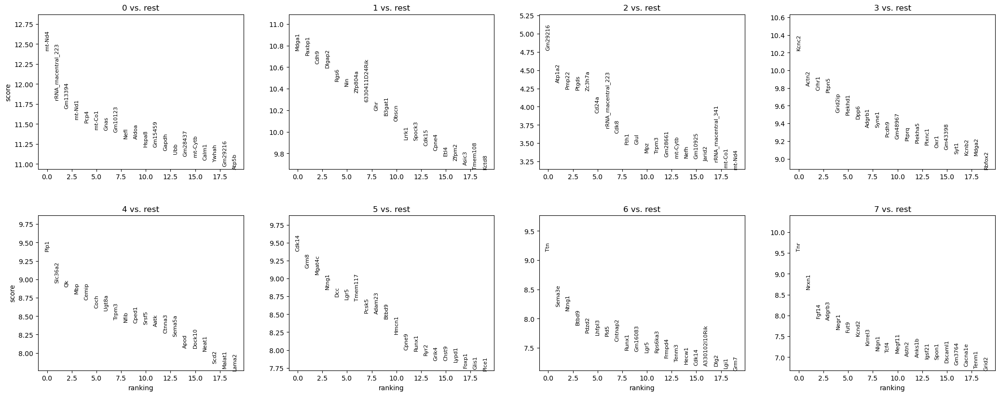

In [79]:
sc.tl.rank_genes_groups(MaybeNeuron, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(MaybeNeuron, n_genes=20, sharey=False)

### Cluster 4 exclusive

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


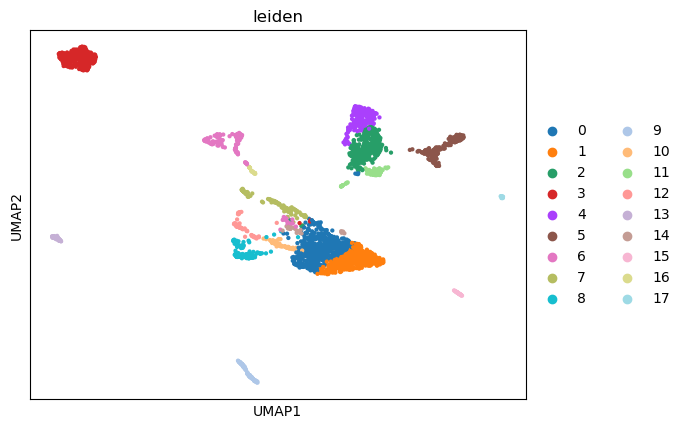

In [84]:
sc.pl.umap(modified,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


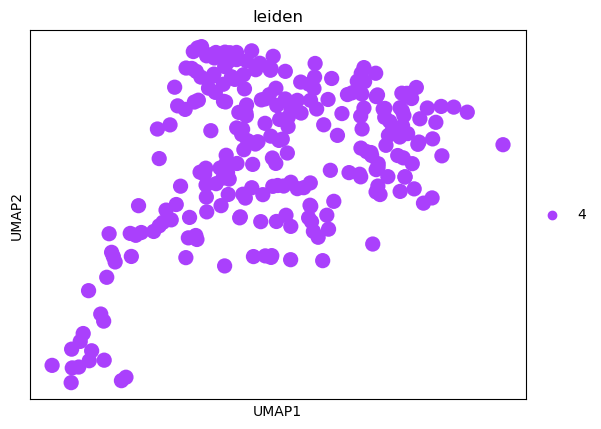

In [85]:
PNASsuspectcluster4=modified[modified.obs['leiden'] == '4', :]
sc.pl.umap(PNASsuspectcluster4,color='leiden')

In [86]:
PNASsuspectcluster4

View of AnnData object with n_obs × n_vars = 249 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi', 'log1p', 'Scale'
    obsp: 'connectivities', 'distances'

In [87]:
sc.tl.leiden(PNASsuspectcluster4, resolution=0.8)
sc.tl.umap(PNASsuspectcluster4,min_dist=0.2)

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


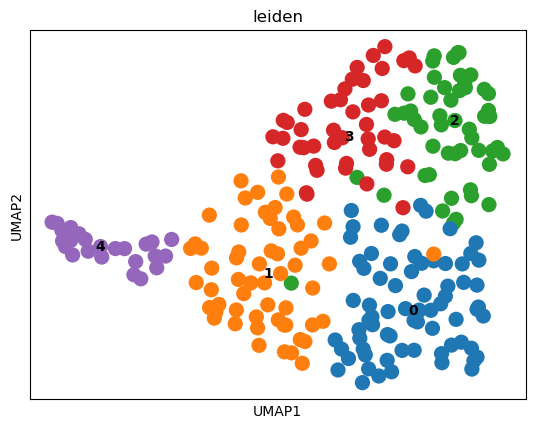

In [88]:
sc.pl.umap(PNASsuspectcluster4,color='leiden',legend_loc='on data')

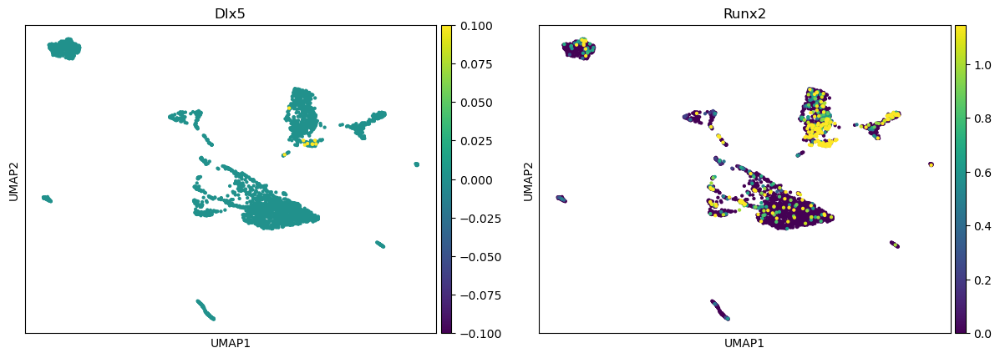

In [104]:
#osteoblasts
sc.pl.umap(modified,color=['Dlx5','Runx2'],legend_loc='on data',vmax='p95',layer='log1p')

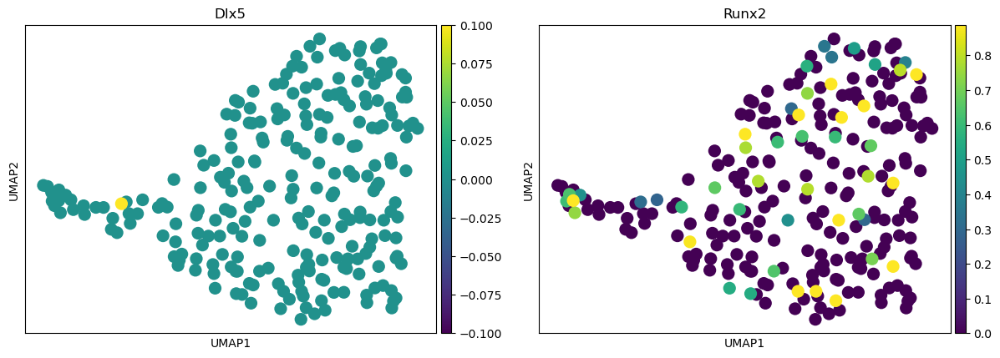

In [89]:
#osteoblasts
sc.pl.umap(PNASsuspectcluster4,color=['Dlx5','Runx2'],legend_loc='on data',vmax='p95',layer='log1p')

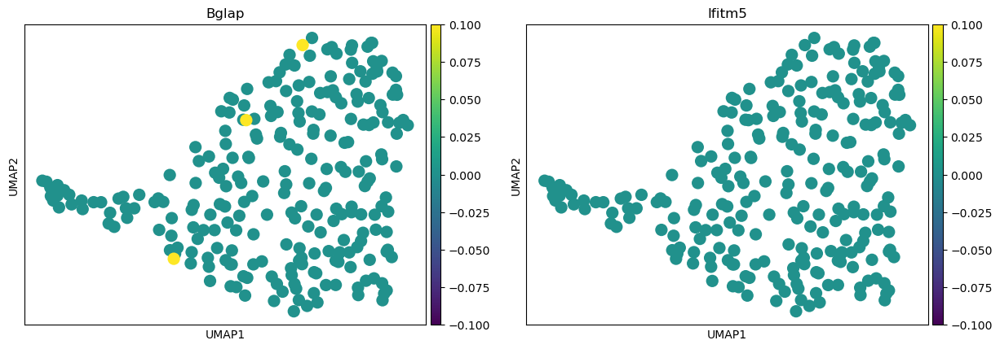

In [90]:
#Osteoblasts
sc.pl.umap(PNASsuspectcluster4,color=['Bglap','Ifitm5'],legend_loc='on data',vmax='p95',layer='log1p')

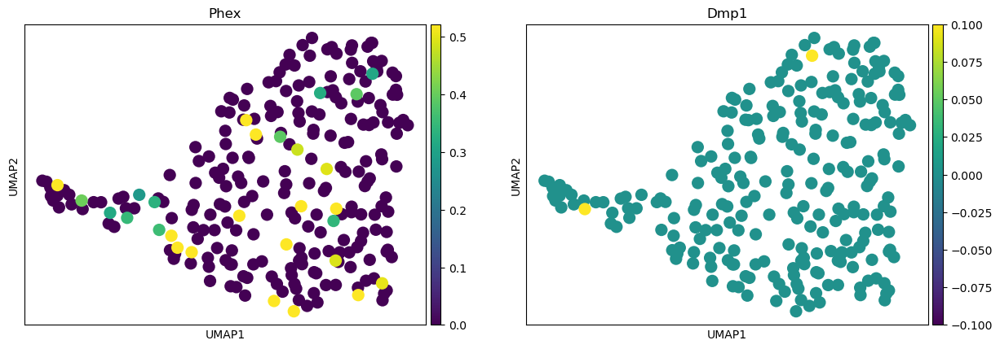

In [91]:
#Osteocytes
sc.pl.umap(PNASsuspectcluster4,color=['Phex','Dmp1'],legend_loc='on data',vmax='p95',layer='log1p')

In [100]:
#save the file
PNASsuspectcluster4.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/PNASsuspectcluster4.h5ad")